<a href="https://colab.research.google.com/github/Dim0000n/Fashion-Mnist-GAN-generation-via-Mnist-classification/blob/main/GAN_fashion_MNIST_via_MNIST_v_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tensorflow.keras.layers import Input,Dense,Reshape,Flatten,Dropout
from tensorflow.keras.layers import BatchNormalization, Activation,MaxPooling2D, Embedding,multiply,Conv2DTranspose,Concatenate
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D,Conv2D
from tensorflow.keras.models import Sequential, Model

from tensorflow.keras.utils import plot_model,to_categorical
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.datasets import mnist,fashion_mnist

import matplotlib.pyplot as plt

import sys
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Mnist Classifier

##Data loading

In [ ]:
(x_trainMnist,y_trainMnistlb),(x_testMnist,y_testMnistlb)=mnist.load_data() #загрузка данных

11501568/11490434 [==============================] - 0s 0us/step


In [ ]:
num_classes=10 #количество классов
x_trainMnist=x_trainMnist.astype(float)/255. #нормировка изображений
x_testMnist=x_testMnist.astype(float)/255. 
y_trainMnist=to_categorical(y_trainMnistlb,10) #преобразование лейблов в ohe
y_testMnist=to_categorical(y_testMnistlb,10)

In [ ]:
print(x_trainMnist.shape)
print(x_testMnist.shape)
print(y_trainMnist.shape)
print(y_testMnist.shape)

(60000, 28, 28)
(10000, 28, 28)
(60000, 10)
(10000, 10)


##Model creation

In [ ]:
model=Sequential()
model.add(Flatten(input_shape=(28,28)))
model.add(Dense(256,activation='relu'))
model.add(Dense(128,activation='relu'))
model.add(Dense(num_classes,activation='softmax'))

model.compile(optimizer=Adam(learning_rate=1e-3),loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
model.load_weights('/content/drive/MyDrive/PostUAI/advancedGAN/FashionMnistViaMnist/classifier_weights.h5') #заугрузка весов классификатора

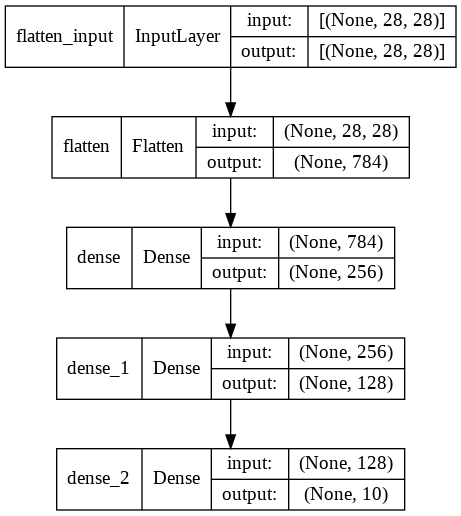

In [ ]:
plot_model(model,show_shapes=True)

##Training

In [ ]:
history=model.fit(x_trainMnist,y_trainMnist,epochs=10,batch_size=256,shuffle=True,validation_data=(x_testMnist,y_testMnist) )

Epoch 1/10
235/235 [==============================] - 5s 7ms/step - loss: 0.3384 - accuracy: 0.9048 - val_loss: 0.1497 - val_accuracy: 0.9569
Epoch 2/10
235/235 [==============================] - 2s 7ms/step - loss: 0.1268 - accuracy: 0.9623 - val_loss: 0.1255 - val_accuracy: 0.9614
Epoch 3/10
235/235 [==============================] - 1s 6ms/step - loss: 0.0849 - accuracy: 0.9744 - val_loss: 0.0958 - val_accuracy: 0.9694
Epoch 4/10
235/235 [==============================] - 1s 6ms/step - loss: 0.0611 - accuracy: 0.9814 - val_loss: 0.0795 - val_accuracy: 0.9758
Epoch 5/10
235/235 [==============================] - 2s 7ms/step - loss: 0.0471 - accuracy: 0.9857 - val_loss: 0.0730 - val_accuracy: 0.9775
Epoch 6/10
235/235 [==============================] - 1s 6ms/step - loss: 0.0366 - accuracy: 0.9889 - val_loss: 0.0726 - val_accuracy: 0.9784
Epoch 7/10
235/235 [==============================] - 1s 6ms/step - loss: 0.0285 - accuracy: 0.9914 - val_loss: 0.0717 - val_accuracy: 0.9784
Epoch 

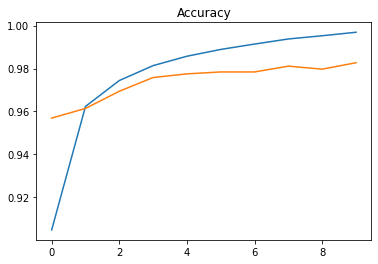

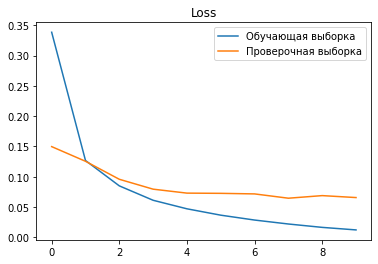

In [ ]:
plt.plot(history.history['accuracy'],label="Обучающая выборка")
plt.plot(history.history['val_accuracy'],label="Проверочная выборка")
plt.title('Accuracy')
plt.show()
plt.plot(history.history['loss'],label="Обучающая выборка")
plt.plot(history.history['val_loss'],label="Проверочная выборка")
plt.title('Loss')
plt.legend()
plt.show()

In [ ]:
model.compile(optimizer=Adam(learning_rate=1e-3),loss='categorical_crossentropy',metrics=['accuracy'])
history=model.fit(x_trainMnist,y_trainMnist,epochs=20,batch_size=256,shuffle=True,validation_data=(x_testMnist,y_testMnist),initial_epoch=10 )

Epoch 11/20
235/235 [==============================] - 2s 6ms/step - loss: 0.0173 - accuracy: 0.9942 - val_loss: 0.0734 - val_accuracy: 0.9809
Epoch 12/20
235/235 [==============================] - 1s 6ms/step - loss: 0.0114 - accuracy: 0.9967 - val_loss: 0.0855 - val_accuracy: 0.9774
Epoch 13/20
235/235 [==============================] - 2s 6ms/step - loss: 0.0090 - accuracy: 0.9973 - val_loss: 0.0833 - val_accuracy: 0.9780
Epoch 14/20
235/235 [==============================] - 2s 7ms/step - loss: 0.0122 - accuracy: 0.9961 - val_loss: 0.0763 - val_accuracy: 0.9808
Epoch 15/20
235/235 [==============================] - 2s 7ms/step - loss: 0.0093 - accuracy: 0.9972 - val_loss: 0.0895 - val_accuracy: 0.9788
Epoch 16/20
235/235 [==============================] - 2s 7ms/step - loss: 0.0073 - accuracy: 0.9976 - val_loss: 0.0819 - val_accuracy: 0.9797
Epoch 17/20
235/235 [==============================] - 2s 6ms/step - loss: 0.0059 - accuracy: 0.9983 - val_loss: 0.0821 - val_accuracy: 0.9804

#cGan

##Data loading

In [ ]:
(x_train,y_train),(x_test,y_test)=fashion_mnist.load_data()

x_train=np.concatenate((x_train,x_test))
y_trainlb=np.concatenate((y_train,y_test)) #получаем лейблы
x_train.shape

4431872/4422102 [==============================] - 0s 0us/step


(70000, 28, 28)

In [ ]:
#нормируем изображения
x_train=x_train/127.5-1.
x_train=np.expand_dims(x_train,axis=3)

##Models

In [ ]:
#параметры изображения
img_height=28
img_width=28
channels=1
img_shape=(img_height,img_width,channels)

random_vec=100      #размерность входного вектора генератора
dropout_rate=0.4    

batch_size=128
n_classes=10

In [ ]:
def create_cc_gen(random_vec,n_classes):

  alpha=0.2 #пармертр LeakyReLU
  #вход лейбла
  labels_in=Input(shape=(n_classes,))
  labels=Dense(7*7) (labels_in)
  labels=Reshape((7,7,1)) (labels)

  #вход шума
  noise=Input(shape=(random_vec,))
  img=Dense(128*7*7) (noise)
  img=LeakyReLU(alpha=alpha) (img)
  img=Reshape((7,7,128)) (img)

  merge=multiply([img,labels])

  gen=Conv2D(128,4,1,padding='same') (merge)
  gen=LeakyReLU(alpha=alpha) (gen)
  gen=Conv2DTranspose(128,4,2,padding='same') (gen)
  gen=LeakyReLU(alpha=alpha) (gen)
  gen=Conv2D(256,4,1,padding='same') (gen)
  gen=LeakyReLU(alpha=alpha) (gen)
  gen=Conv2DTranspose(256,4,2,padding='same') (gen)
  gen=LeakyReLU(alpha=alpha) (gen)

  img=Conv2D(1,(7,7),activation='tanh',padding='same') (gen)

  model=Model([noise,labels_in],img)

  return model

  

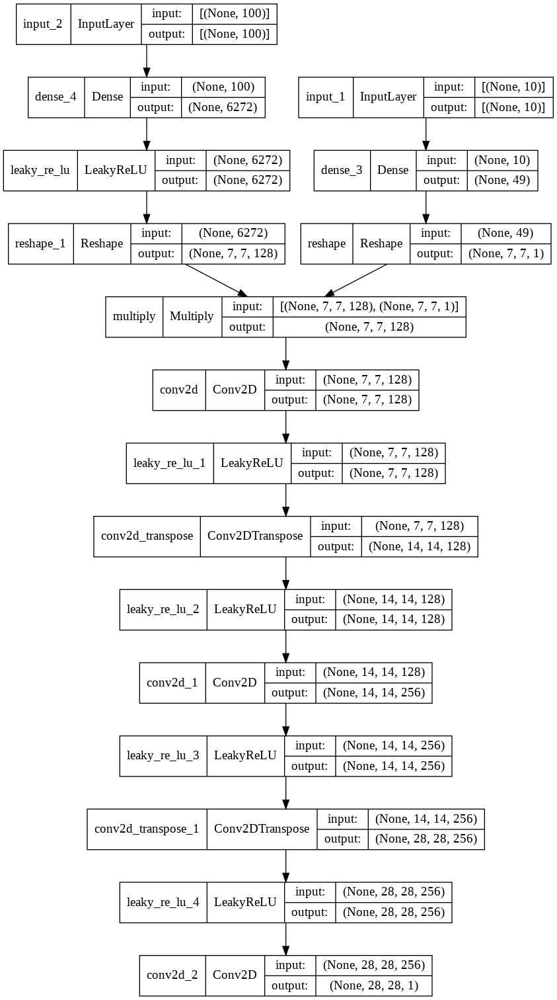

In [ ]:
cc_gen=create_cc_gen(random_vec,n_classes)
plot_model(cc_gen,show_shapes=True)

In [ ]:
def create_cc_discr(n_classes,img_shape,dropout_rate):

  alpha=0.2  #параметр LeakyReLU

  img=Input(shape=img_shape) #входизображения

  labels_input=Input(shape=(n_classes,))       #вход лейбла
  labels=Dense(np.prod(img_shape)) (labels_input)
  labels=Reshape((img_shape[0],img_shape[1],img_shape[2])) (labels)

  merge=multiply([img,labels])

  dis=Conv2D(128,3,2,padding='same') (merge)
  dis=LeakyReLU(alpha=alpha) (dis)
  dis=Conv2D(256,3,1,padding='same') (dis)
  dis=LeakyReLU(alpha=alpha) (dis)
  dis=Conv2D(256,3,2,padding='same') (dis)
  dis=LeakyReLU(alpha=alpha) (dis)

  dis=Flatten() (dis)
  dis=Dropout(dropout_rate) (dis)
  
  classifier_layer=Dense(1,activation='sigmoid') (dis)

  cc_discr=Model([img,labels_input],classifier_layer)

  cc_discr.compile(loss='binary_crossentropy', optimizer=Adam(0.0002,0.5), metrics=['accuracy'])

  cc_discr.trainable=False

  return cc_discr

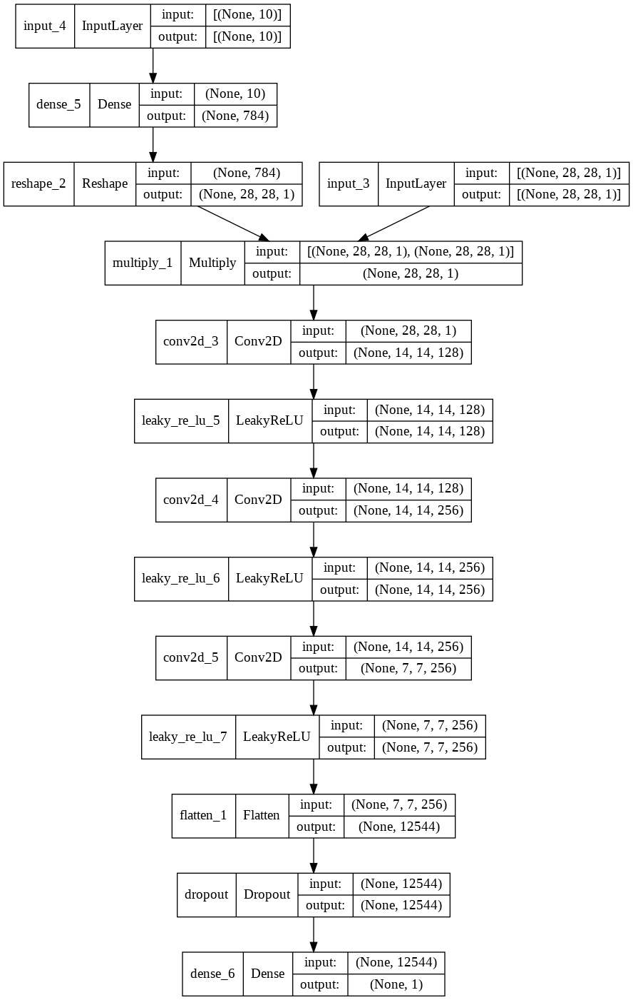

In [ ]:
cc_discr=create_cc_discr(n_classes,img_shape,dropout_rate)
plot_model(cc_discr,show_shapes=True)

##Function to show training progress

In [ ]:
def show_learning_progress(gen,classifier,x_data,y_data):
    '''
    gen - генератор
    classifier - классификатор MNIST
    x_data - входные данные классификатора
    y_data - лейблы для классификатора MNIST
    '''
    noise=np.random.normal(size=(1,random_vec)) #входной шум генератора
    fig=plt.figure(figsize=(15,20))
    
    predict_lbs=[]
    for i in range(10):
      plt.subplot(1,10,i+1)

      curr_numbers=x_data[y_data==i]     #получаем все изображения текущего лейбла
      ind=np.random.randint(0,curr_numbers.shape[0])  #получаем индекс
      lb=classifier.predict(np.expand_dims(curr_numbers[ind],axis=0))#делаем предикт изображения
      predict_lbs.append(np.argmax(lb))

      predict_gen=cc_gen.predict([noise,lb])   #генерируем изображение

      plt.imshow(predict_gen[0].reshape(28,28),cmap='gray')
      plt.axis('off')
    plt.show()
    print('Labels', predict_lbs)

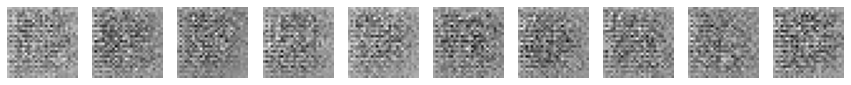

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [ ]:
show_learning_progress(cc_gen,model,x_testMnist,y_testMnistlb)

##Traning

In [ ]:
cc_gen.load_weights('/content/drive/MyDrive/PostUAI/advancedGAN/FashionMnistViaMnist/cc_gen39000_weights.h5')
cc_discr.load_weights('/content/drive/MyDrive/PostUAI/advancedGAN/FashionMnistViaMnist/cc_discr39000_weights.h5')

In [ ]:
batch_size=128

def GAN_alorithm(generator,discriminator,classifier,x_train,y_train,x_data,y_data,epochs=30000,batch_size=128):
  '''
  generator - генератор
  discriminator - дискриминатор
  classifier - классификатора MNIST
  x_train - входные данные дискриминатора
  y_train - выходные данные дискриминатора
  x_data - входные данные классификатора
  y_data  - лейблы для классфикатора
  epochs - эпохи обучения
  '''

  true_labels_img=np.ones((batch_size,1)) #массив единиц для обучения дискриминатора
  generated_labels_img=np.zeros((batch_size,1)) #массив нулей для обучения дискриминатора

  #Создаем модель GAN
  noise=Input(shape=(random_vec,))
  label=Input(shape=(10,))
  img=generator([noise,label])
  checkup=discriminator([img,label])

  GAN=Model([noise,label],checkup)
  GAN.compile(loss='binary_crossentropy',optimizer=Adam(0.0002,0.5))

  view_interval=150 #интервал просмотра прогресса обучения

  d_loss_list=[] #лист ошибки дискриминатора
  d_acc_list=[] #лист точности дискриминатора
  g_loss_list=[] #лист ошибки генератора

  for epoch in range(epochs):
      index=np.random.randint(0,x_train.shape[0],batch_size) #генерируем набо индексов
      
      imgs,labels=x_train[index],y_train[index] #получаем изображения и лейблы для дискриминатора
    
      x_imgs=[]                        #лист для изображений цифр
      for lb in  labels:               #получаем случайное число для каждого лейбла
        curr_imgs=x_data[y_data==lb]
        ind=np.random.randint(0,curr_imgs.shape[0])
        x_imgs.append(curr_imgs[ind])
      
      labels=classifier.predict(np.array(x_imgs)) #делаем предикт цифр
      
      noise=np.random.normal(0,1,(batch_size,random_vec)) #создаем шум

      gen_imgs=generator.predict([noise,labels])

      #обучаем дискриминатор
      d_loss_real=discriminator.train_on_batch([imgs,labels],true_labels_img)      #обучаем генератор на рельных изображениях
      d_loss_gen=discriminator.train_on_batch([gen_imgs,labels],generated_labels_img)  #обучаем генератор на шуме

      d_loss=0.5*np.add(d_loss_real,d_loss_gen) #считаем общую ошибку

      #обучаем генератор
      g_loss=GAN.train_on_batch([noise,labels],true_labels_img)

      d_loss_list.append(d_loss[0])
      d_acc_list.append(100*d_loss[1])
      g_loss_list.append(g_loss)

      if((epoch % view_interval==0) | (epoch ==epochs-1)):      #показываем результат
        show_learning_progress(cc_gen,classifier,x_data,y_data)
        print('%d [D loss: %f, acc.:%.2f%%] [G loss: %f]' % (epoch, d_loss[0],100*d_loss[1],g_loss))
  
  plt.plot(d_loss_list,label='Ошибка дискриминатора')
  plt.plot(g_loss_list, label='Ошибка генератора')
  plt.legend()
  plt.show()
  plt.plot(d_acc_list,label='Точность дискриминатора')
  plt.legend()
  plt.show()
      

Первым этапом удалось обучить модель примерно на 14 тыс эпохах, после пришлось остановить, т.к. нейронка училась более 2х часов и колаб мог выкинуть.

Firstly,the training process was stopped at 14k epochs due the Colab limitations. 

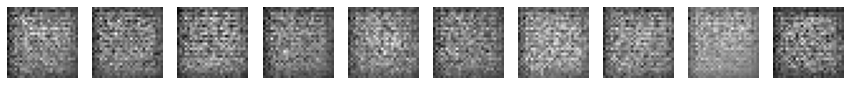

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
0 [D loss: 11.523566, acc.:50.00%] [G loss: 0.000064]


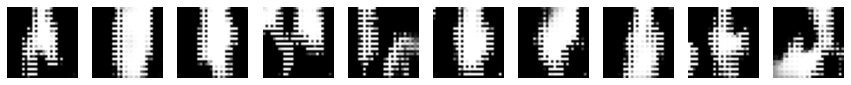

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
150 [D loss: 0.384786, acc.:84.77%] [G loss: 2.859892]


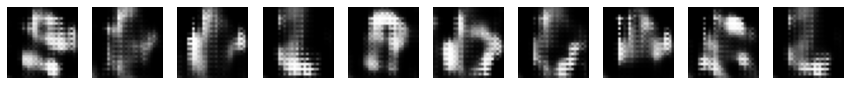

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 3]
300 [D loss: 0.744136, acc.:43.75%] [G loss: 0.783687]


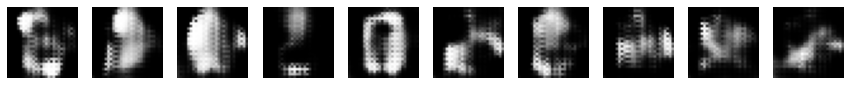

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
450 [D loss: 0.711059, acc.:49.22%] [G loss: 0.744628]


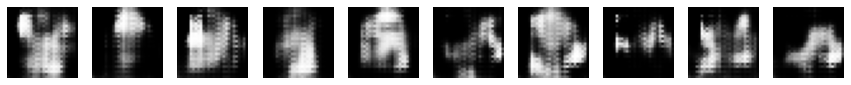

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
600 [D loss: 0.698346, acc.:43.36%] [G loss: 0.704714]


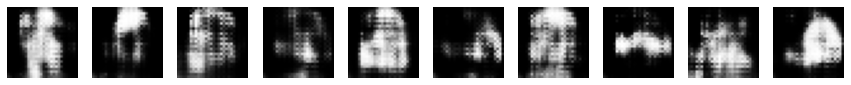

Labels [0, 1, 2, 5, 4, 5, 6, 7, 8, 9]
750 [D loss: 0.705640, acc.:41.02%] [G loss: 0.712427]


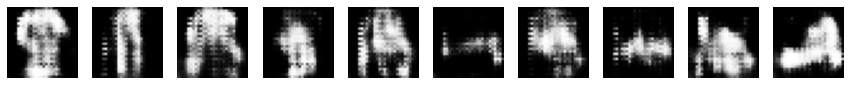

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
900 [D loss: 0.696851, acc.:45.70%] [G loss: 0.706745]


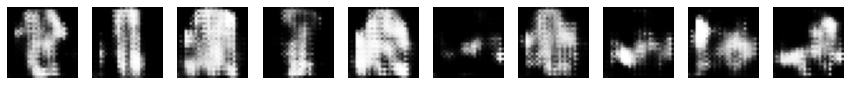

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1050 [D loss: 0.695055, acc.:47.27%] [G loss: 0.704344]


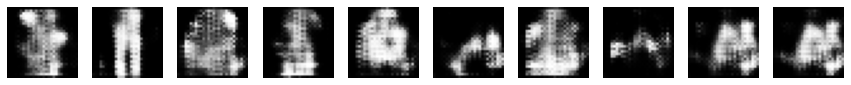

Labels [0, 1, 2, 3, 4, 5, 6, 7, 9, 9]
1200 [D loss: 0.692073, acc.:53.52%] [G loss: 0.705741]


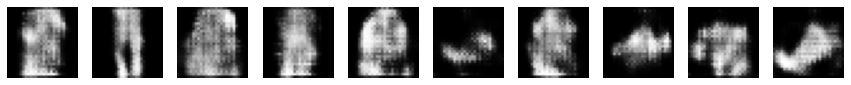

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1350 [D loss: 0.693326, acc.:48.44%] [G loss: 0.704718]


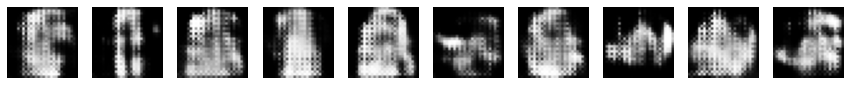

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1500 [D loss: 0.697322, acc.:43.75%] [G loss: 0.702759]


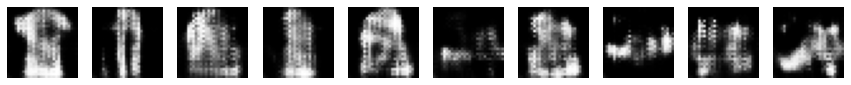

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1650 [D loss: 0.697860, acc.:39.84%] [G loss: 0.701985]


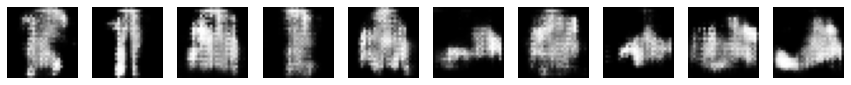

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1800 [D loss: 0.690981, acc.:49.61%] [G loss: 0.712892]


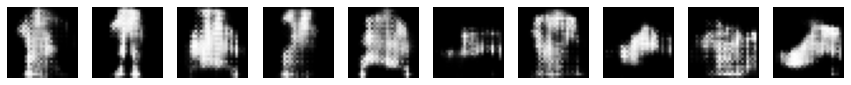

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1950 [D loss: 0.675794, acc.:64.45%] [G loss: 0.754903]


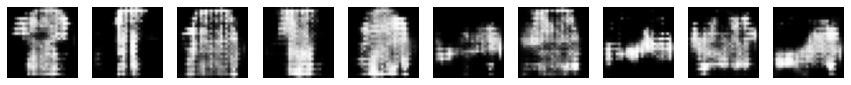

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2100 [D loss: 0.686965, acc.:55.86%] [G loss: 0.708739]


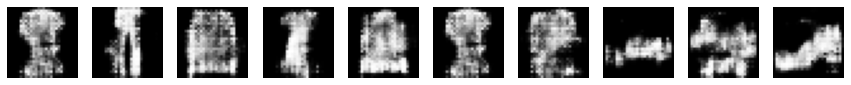

Labels [0, 1, 2, 3, 4, 0, 6, 7, 8, 9]
2250 [D loss: 0.692558, acc.:54.69%] [G loss: 0.699901]


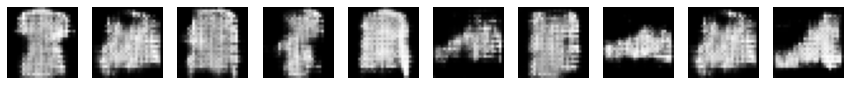

Labels [0, 8, 2, 3, 4, 5, 6, 7, 8, 9]
2400 [D loss: 0.690403, acc.:50.39%] [G loss: 0.725920]


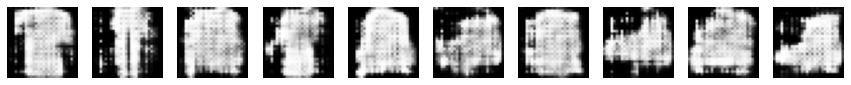

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2550 [D loss: 0.715966, acc.:38.28%] [G loss: 0.682950]


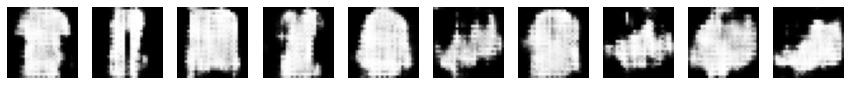

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2700 [D loss: 0.660363, acc.:69.53%] [G loss: 0.821810]


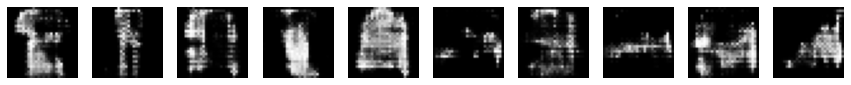

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2850 [D loss: 0.669297, acc.:54.30%] [G loss: 0.735045]


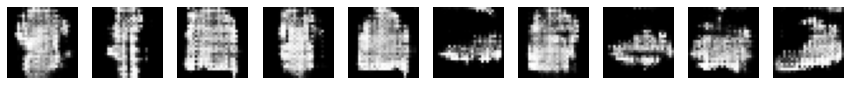

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3000 [D loss: 0.673918, acc.:61.33%] [G loss: 0.740447]


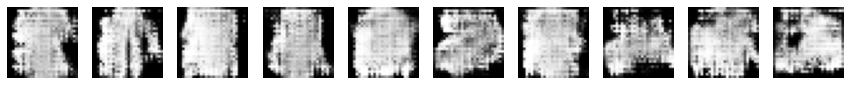

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3150 [D loss: 0.668967, acc.:60.94%] [G loss: 0.826039]


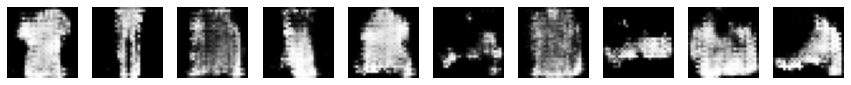

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3300 [D loss: 0.673916, acc.:57.03%] [G loss: 0.723636]


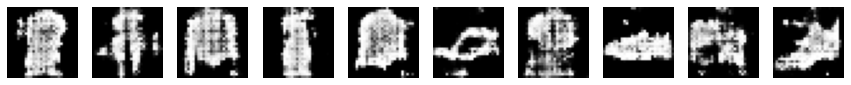

Labels [0, 7, 2, 3, 4, 5, 6, 7, 8, 9]
3450 [D loss: 0.685709, acc.:44.14%] [G loss: 0.736228]


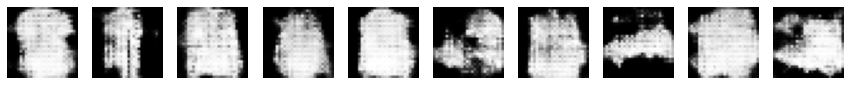

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3600 [D loss: 0.587797, acc.:68.75%] [G loss: 1.362592]


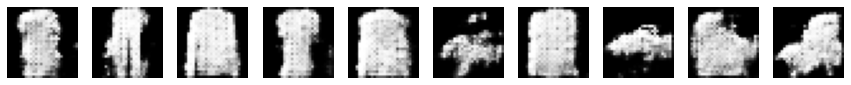

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3750 [D loss: 0.666327, acc.:66.02%] [G loss: 0.867741]


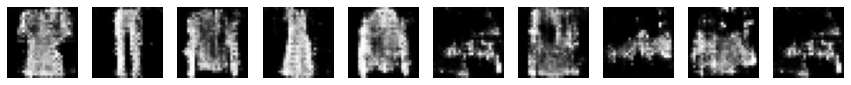

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 5]
3900 [D loss: 0.628716, acc.:62.89%] [G loss: 0.818596]


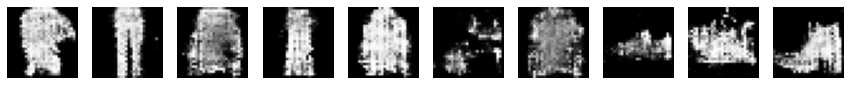

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4050 [D loss: 0.662025, acc.:55.47%] [G loss: 0.755753]


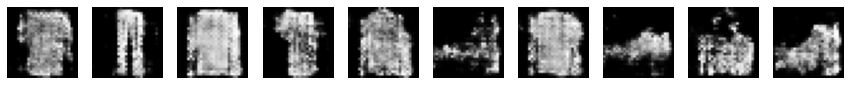

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4200 [D loss: 0.636532, acc.:66.02%] [G loss: 0.805304]


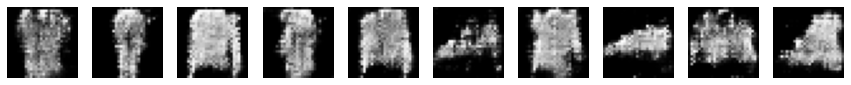

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4350 [D loss: 0.635993, acc.:67.97%] [G loss: 0.913778]


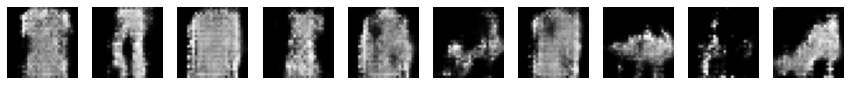

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4500 [D loss: 0.665143, acc.:57.03%] [G loss: 0.830625]


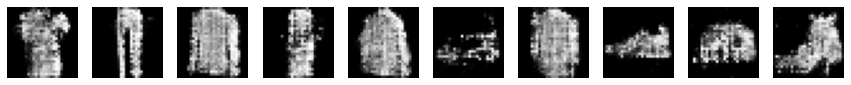

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4650 [D loss: 0.673594, acc.:53.52%] [G loss: 0.703862]


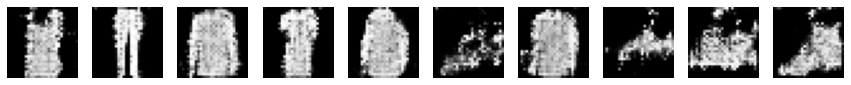

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4800 [D loss: 0.682963, acc.:55.08%] [G loss: 0.786169]


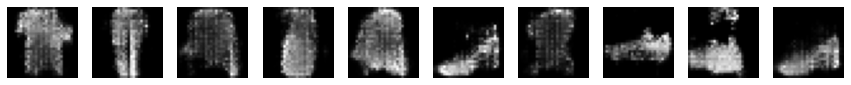

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 5]
4950 [D loss: 0.708245, acc.:46.88%] [G loss: 0.718800]


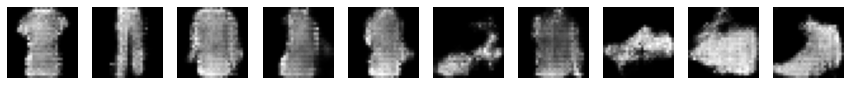

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5100 [D loss: 0.680073, acc.:55.86%] [G loss: 0.742624]


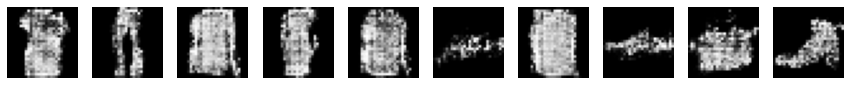

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5250 [D loss: 0.692664, acc.:53.12%] [G loss: 0.723430]


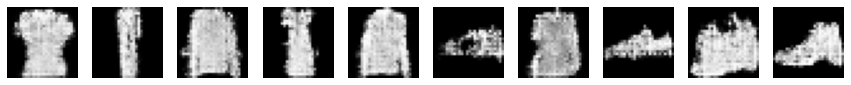

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5400 [D loss: 0.683529, acc.:50.78%] [G loss: 0.729506]


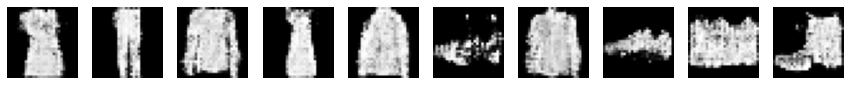

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5550 [D loss: 0.697308, acc.:51.17%] [G loss: 0.704725]


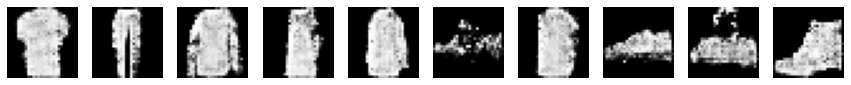

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5700 [D loss: 0.678643, acc.:60.94%] [G loss: 0.751185]


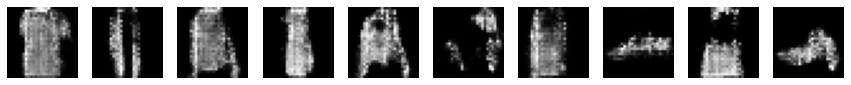

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5850 [D loss: 0.728264, acc.:42.19%] [G loss: 0.718297]


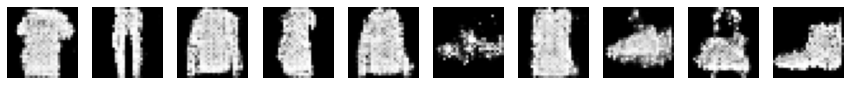

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6000 [D loss: 0.696669, acc.:54.30%] [G loss: 0.728808]


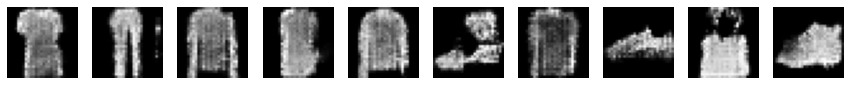

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6150 [D loss: 0.684351, acc.:53.52%] [G loss: 0.745840]


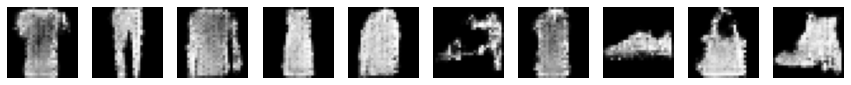

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6300 [D loss: 0.688732, acc.:50.39%] [G loss: 0.747512]


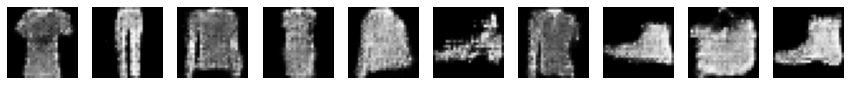

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6450 [D loss: 0.682498, acc.:53.91%] [G loss: 0.730048]


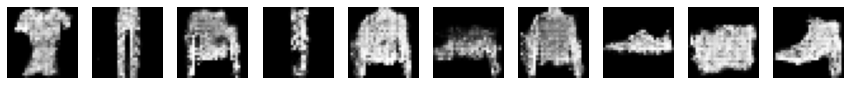

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6600 [D loss: 0.675524, acc.:56.25%] [G loss: 0.762896]


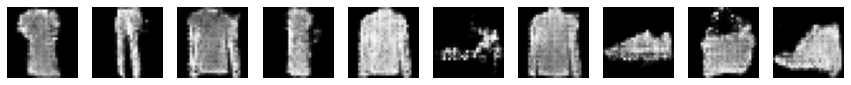

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6750 [D loss: 0.692748, acc.:53.12%] [G loss: 0.754017]


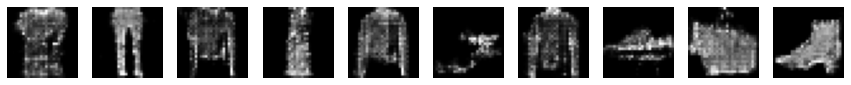

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6900 [D loss: 0.706880, acc.:41.80%] [G loss: 0.721078]


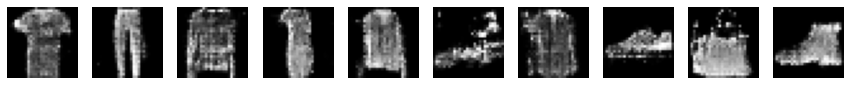

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7050 [D loss: 0.668700, acc.:57.42%] [G loss: 0.751710]


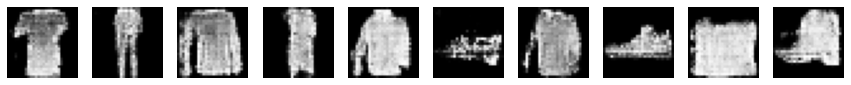

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7200 [D loss: 0.684574, acc.:53.91%] [G loss: 0.739355]


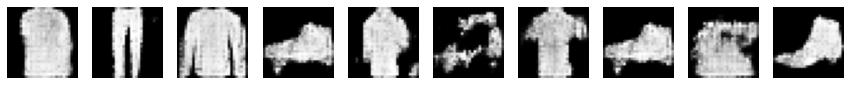

Labels [0, 1, 2, 7, 4, 5, 6, 7, 8, 9]
7350 [D loss: 0.718903, acc.:44.53%] [G loss: 0.688797]


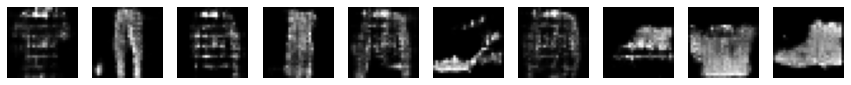

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7500 [D loss: 0.701666, acc.:44.53%] [G loss: 0.696705]


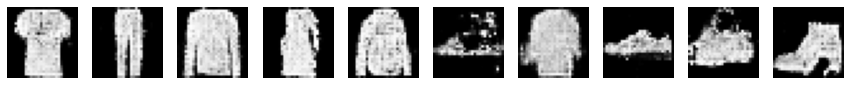

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7650 [D loss: 0.704795, acc.:40.62%] [G loss: 0.703310]


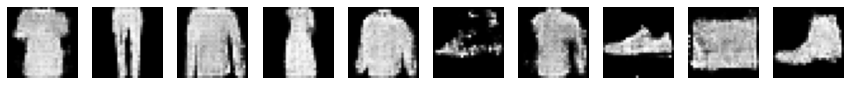

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7800 [D loss: 0.690308, acc.:55.08%] [G loss: 0.723813]


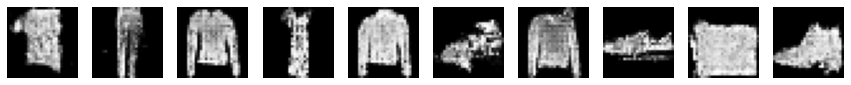

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7950 [D loss: 0.691160, acc.:55.08%] [G loss: 0.714295]


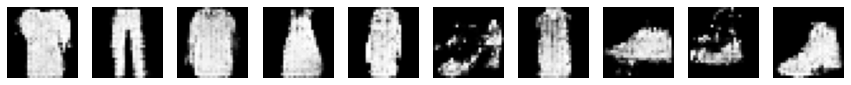

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8100 [D loss: 0.693653, acc.:50.00%] [G loss: 0.696189]


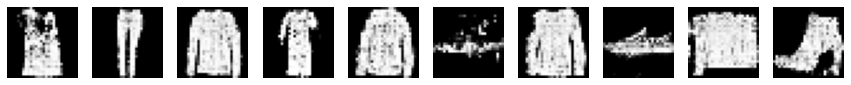

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8250 [D loss: 0.694090, acc.:53.12%] [G loss: 0.715921]


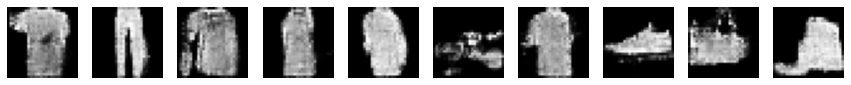

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8400 [D loss: 0.681622, acc.:58.20%] [G loss: 0.744944]


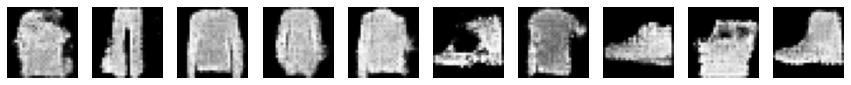

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8550 [D loss: 0.692373, acc.:51.17%] [G loss: 0.710138]


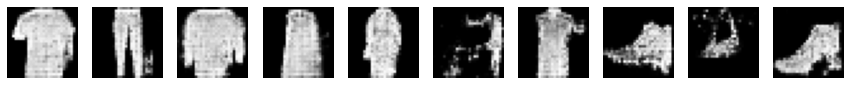

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8700 [D loss: 0.696635, acc.:48.83%] [G loss: 0.708666]


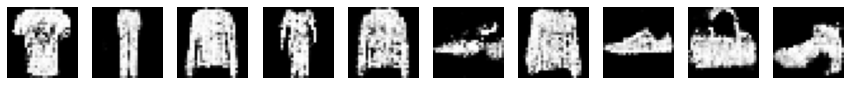

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8850 [D loss: 0.689049, acc.:55.86%] [G loss: 0.738686]


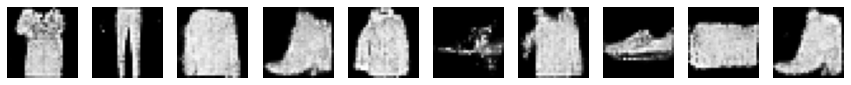

Labels [0, 1, 2, 9, 4, 5, 6, 7, 8, 9]
9000 [D loss: 0.694499, acc.:50.00%] [G loss: 0.715343]


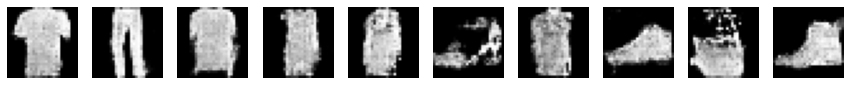

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9150 [D loss: 0.697619, acc.:49.61%] [G loss: 0.714635]


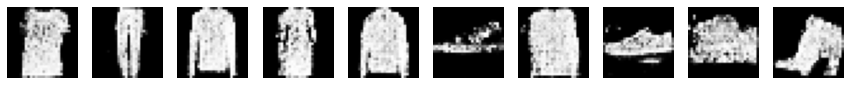

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9300 [D loss: 0.692257, acc.:53.91%] [G loss: 0.709552]


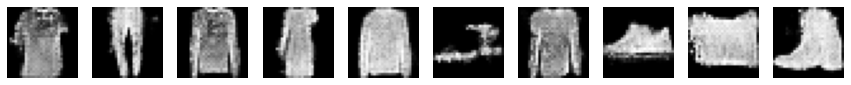

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9450 [D loss: 0.692544, acc.:50.00%] [G loss: 0.720716]


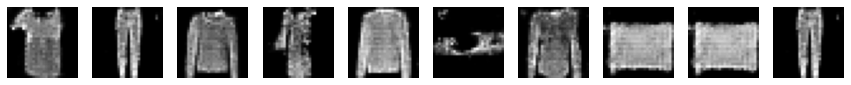

Labels [0, 1, 2, 3, 4, 5, 6, 8, 8, 1]
9600 [D loss: 0.687321, acc.:51.56%] [G loss: 0.712710]


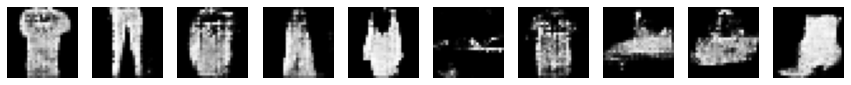

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9750 [D loss: 0.693305, acc.:48.44%] [G loss: 0.729856]


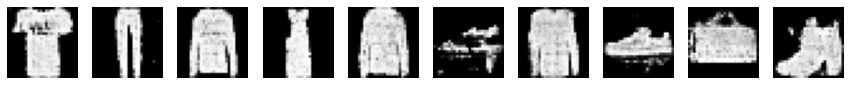

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9900 [D loss: 0.690677, acc.:52.73%] [G loss: 0.720229]


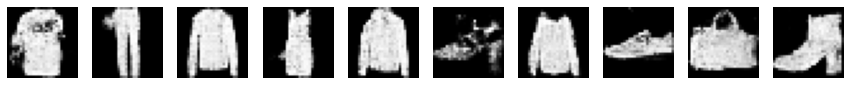

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10050 [D loss: 0.690460, acc.:52.34%] [G loss: 0.714560]


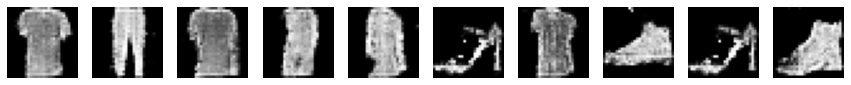

Labels [0, 1, 2, 3, 4, 5, 6, 7, 5, 9]
10200 [D loss: 0.688236, acc.:52.34%] [G loss: 0.719758]


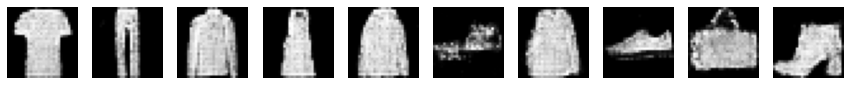

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10350 [D loss: 0.681146, acc.:57.03%] [G loss: 0.718652]


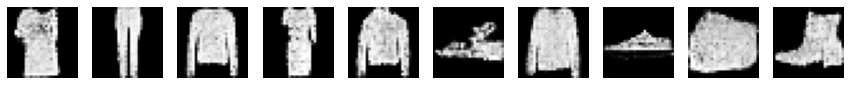

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10500 [D loss: 0.700871, acc.:45.31%] [G loss: 0.700611]


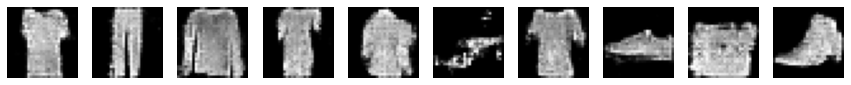

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10650 [D loss: 0.694978, acc.:51.56%] [G loss: 0.724894]


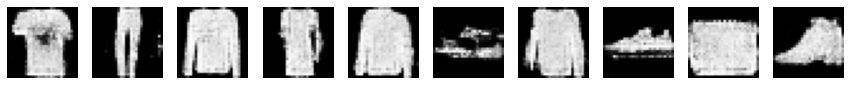

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10800 [D loss: 0.694618, acc.:50.78%] [G loss: 0.721394]


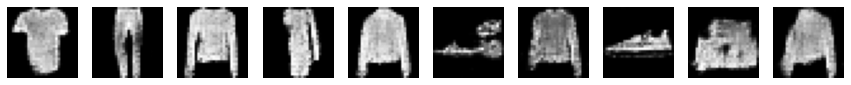

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 4]
10950 [D loss: 0.687329, acc.:53.52%] [G loss: 0.724155]


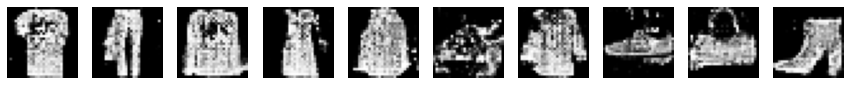

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11100 [D loss: 0.707223, acc.:41.80%] [G loss: 0.708229]


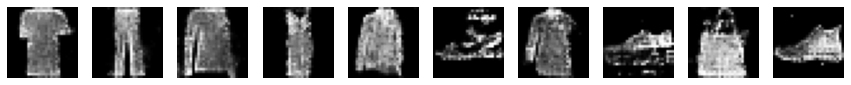

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11250 [D loss: 0.700613, acc.:41.41%] [G loss: 0.694052]


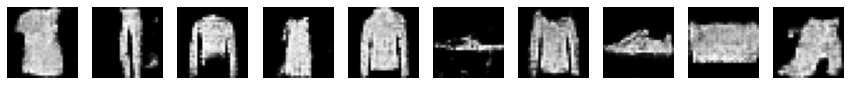

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11400 [D loss: 0.689319, acc.:51.95%] [G loss: 0.716764]


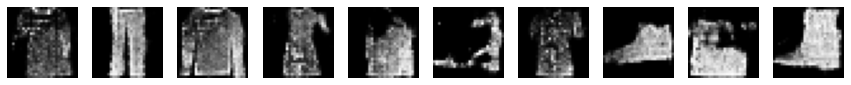

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11550 [D loss: 0.693043, acc.:51.17%] [G loss: 0.710804]


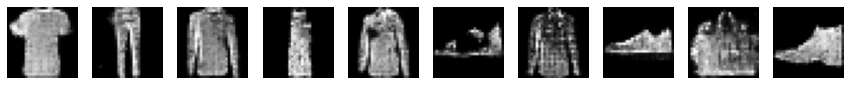

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11700 [D loss: 0.690639, acc.:52.34%] [G loss: 0.722068]


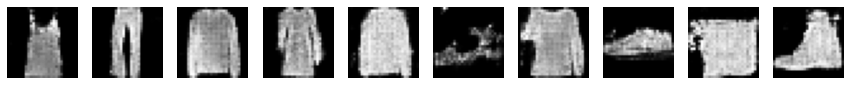

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11850 [D loss: 0.690996, acc.:52.34%] [G loss: 0.700907]


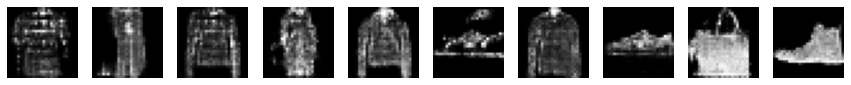

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12000 [D loss: 0.691849, acc.:51.95%] [G loss: 0.711156]


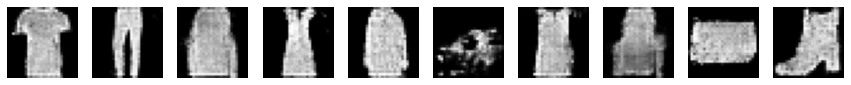

Labels [0, 1, 2, 3, 4, 5, 6, 2, 8, 9]
12150 [D loss: 0.690776, acc.:51.95%] [G loss: 0.716857]


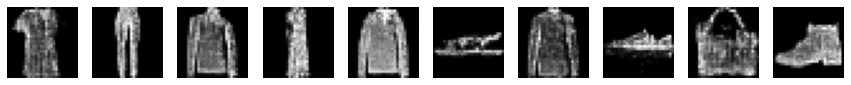

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12300 [D loss: 0.695855, acc.:49.61%] [G loss: 0.707400]


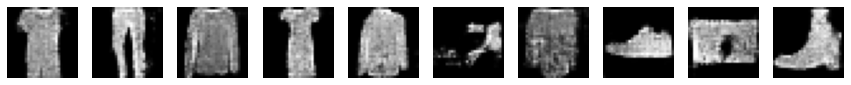

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12450 [D loss: 0.686855, acc.:54.69%] [G loss: 0.726217]


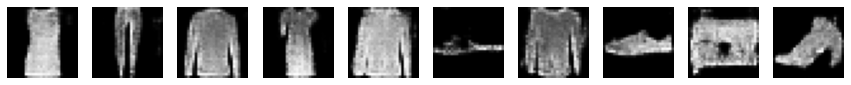

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12600 [D loss: 0.698427, acc.:45.70%] [G loss: 0.704342]


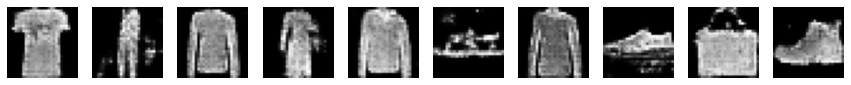

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12750 [D loss: 0.684399, acc.:57.42%] [G loss: 0.714465]


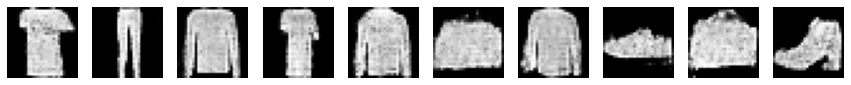

Labels [0, 1, 2, 3, 4, 8, 6, 7, 8, 9]
12900 [D loss: 0.692037, acc.:50.00%] [G loss: 0.716007]


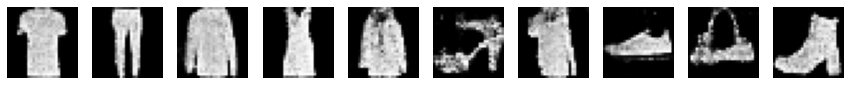

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13050 [D loss: 0.692236, acc.:51.95%] [G loss: 0.705471]


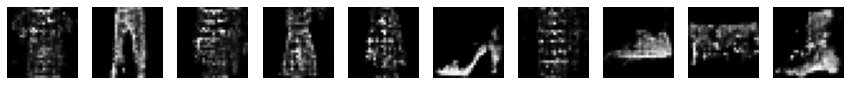

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13200 [D loss: 0.711027, acc.:44.53%] [G loss: 0.703101]


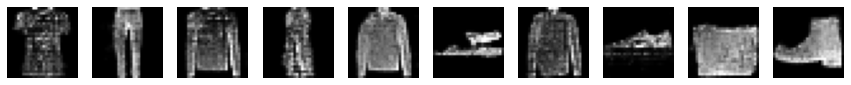

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13350 [D loss: 0.697067, acc.:47.27%] [G loss: 0.704235]


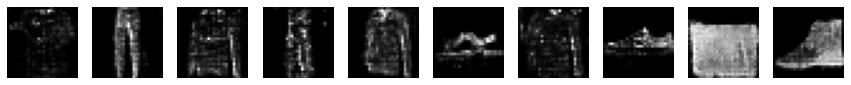

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13500 [D loss: 0.692605, acc.:47.66%] [G loss: 0.708259]


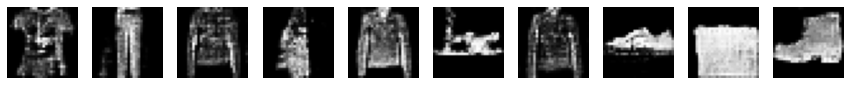

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13650 [D loss: 0.686345, acc.:59.38%] [G loss: 0.707967]


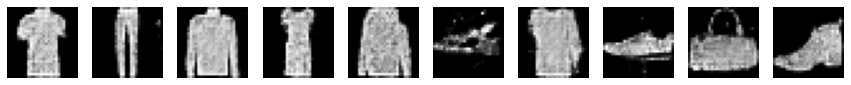

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13800 [D loss: 0.685437, acc.:56.64%] [G loss: 0.721113]


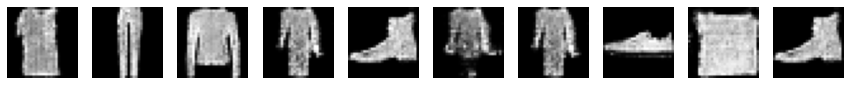

Labels [0, 1, 2, 3, 9, 3, 3, 7, 8, 9]
13950 [D loss: 0.696659, acc.:48.05%] [G loss: 0.709358]


KeyboardInterrupt: ignored

In [ ]:
GAN_alorithm(cc_gen,cc_discr,model,x_train,y_trainlb,x_testMnist,y_testMnistlb)

In [ ]:
#сохрание моделей
model.save_weights('/content/drive/MyDrive/PostUAI/advancedGAN /FashionMnistViaMnist/classifier_weights.h5')
cc_gen.save_weights('/content/drive/MyDrive/PostUAI/advancedGAN /FashionMnistViaMnist/cc_gen13950_weights.h5')
cc_discr.save_weights('/content/drive/MyDrive/PostUAI/advancedGAN /FashionMnistViaMnist/cc_discr13950_weights.h5')

Затем модель доубучалась на еще 15к.
Then, model was trained on 15k epochs more. 

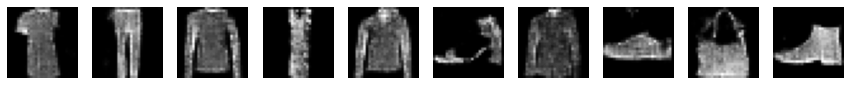

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
0 [D loss: 0.697077, acc.:48.83%] [G loss: 0.698636]


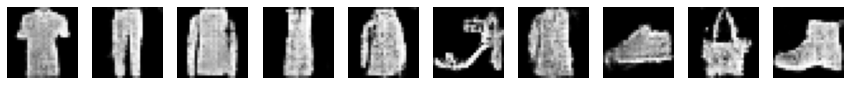

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
150 [D loss: 0.689487, acc.:53.52%] [G loss: 0.720303]


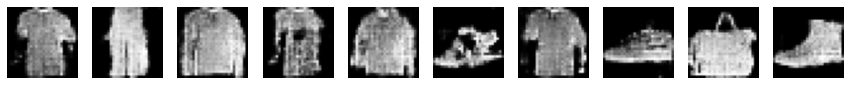

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
300 [D loss: 0.689439, acc.:53.52%] [G loss: 0.701574]


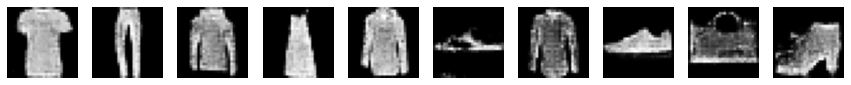

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
450 [D loss: 0.691401, acc.:53.12%] [G loss: 0.708836]


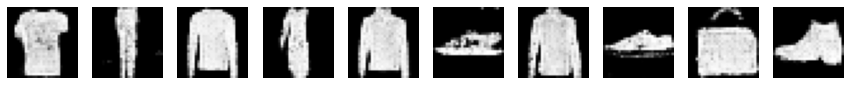

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
600 [D loss: 0.696383, acc.:48.83%] [G loss: 0.704696]


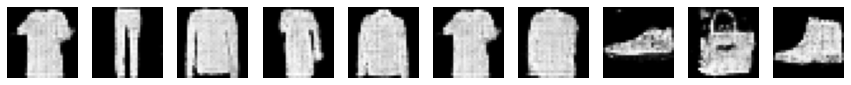

Labels [0, 1, 2, 3, 4, 0, 6, 7, 8, 9]
750 [D loss: 0.682037, acc.:56.64%] [G loss: 0.741823]


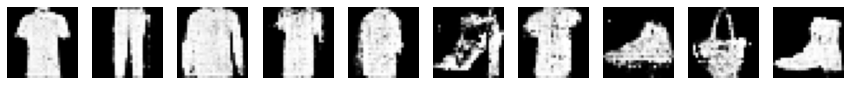

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
900 [D loss: 0.704065, acc.:45.31%] [G loss: 0.700437]


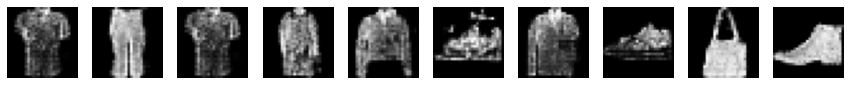

Labels [0, 1, 0, 3, 4, 5, 6, 7, 8, 9]
1050 [D loss: 0.696364, acc.:48.44%] [G loss: 0.717895]


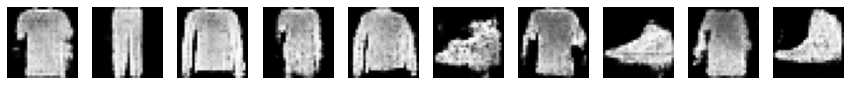

Labels [0, 1, 2, 3, 4, 5, 6, 7, 3, 9]
1200 [D loss: 0.689182, acc.:52.73%] [G loss: 0.718628]


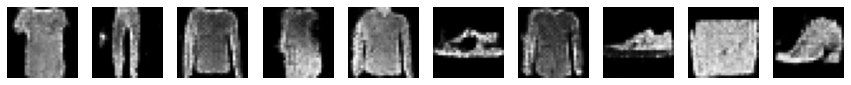

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1350 [D loss: 0.693409, acc.:50.00%] [G loss: 0.699991]


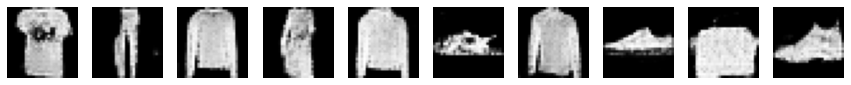

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1500 [D loss: 0.694804, acc.:50.00%] [G loss: 0.721362]


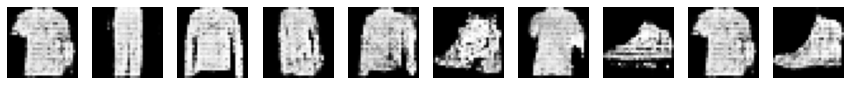

Labels [0, 1, 2, 3, 4, 5, 6, 7, 0, 9]
1650 [D loss: 0.689881, acc.:56.25%] [G loss: 0.729850]


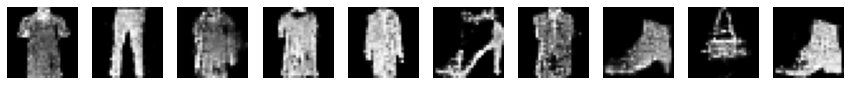

Labels [0, 1, 2, 3, 4, 5, 6, 9, 8, 9]
1800 [D loss: 0.695790, acc.:51.17%] [G loss: 0.708374]


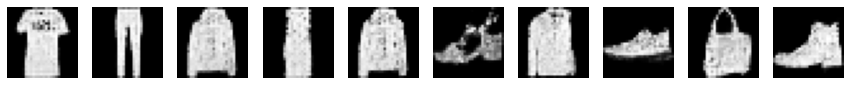

Labels [0, 1, 4, 3, 4, 5, 6, 7, 8, 9]
1950 [D loss: 0.683768, acc.:55.08%] [G loss: 0.720000]


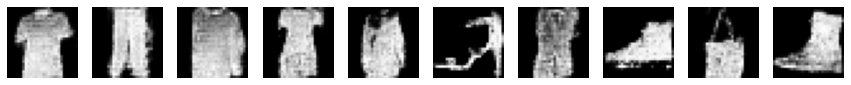

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2100 [D loss: 0.696510, acc.:46.88%] [G loss: 0.704254]


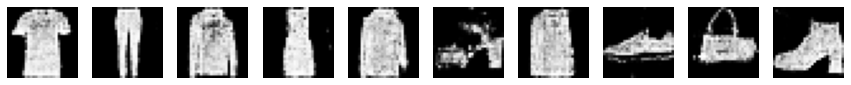

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2250 [D loss: 0.688732, acc.:56.25%] [G loss: 0.709353]


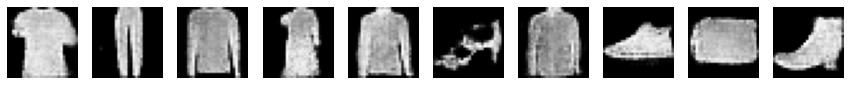

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2400 [D loss: 0.691925, acc.:53.91%] [G loss: 0.722686]


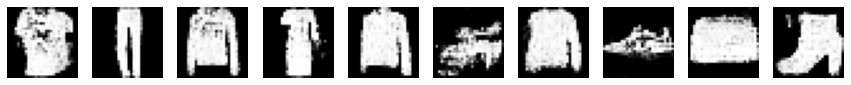

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2550 [D loss: 0.693487, acc.:50.78%] [G loss: 0.706047]


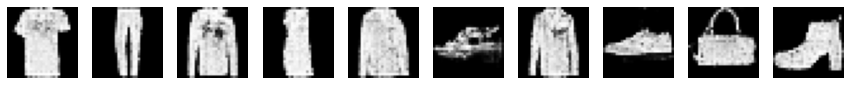

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2700 [D loss: 0.685327, acc.:53.12%] [G loss: 0.719222]


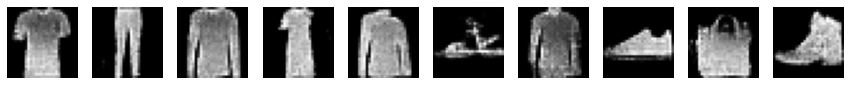

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2850 [D loss: 0.693443, acc.:49.22%] [G loss: 0.709240]


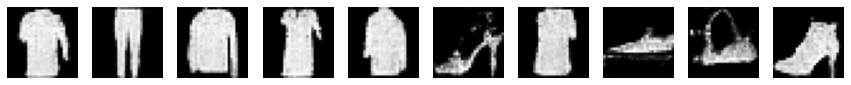

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3000 [D loss: 0.678857, acc.:58.98%] [G loss: 0.752593]


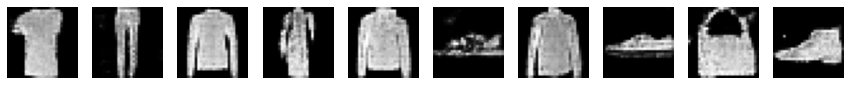

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3150 [D loss: 0.684767, acc.:57.81%] [G loss: 0.724113]


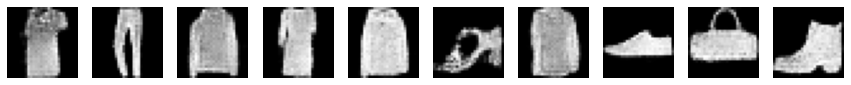

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3300 [D loss: 0.692835, acc.:51.17%] [G loss: 0.725405]


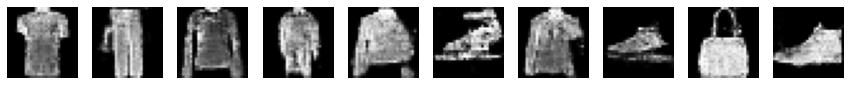

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3450 [D loss: 0.690059, acc.:51.95%] [G loss: 0.714588]


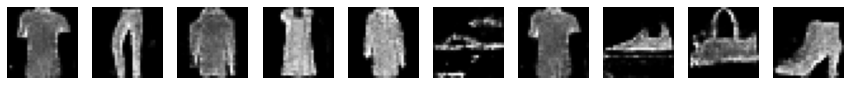

Labels [0, 1, 2, 3, 4, 5, 0, 7, 8, 9]
3600 [D loss: 0.697366, acc.:49.22%] [G loss: 0.713758]


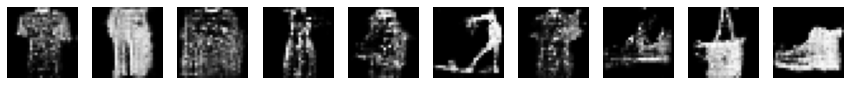

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3750 [D loss: 0.696440, acc.:47.27%] [G loss: 0.698427]


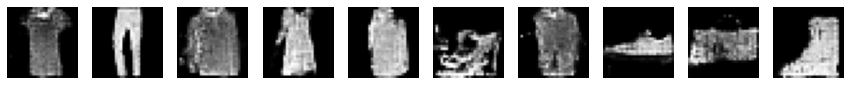

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3900 [D loss: 0.693430, acc.:50.39%] [G loss: 0.712655]


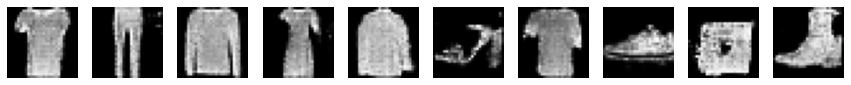

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4050 [D loss: 0.681623, acc.:60.16%] [G loss: 0.722492]


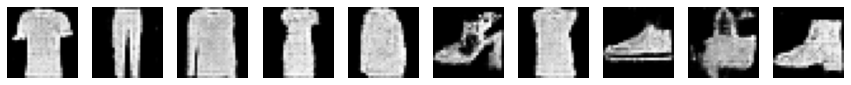

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4200 [D loss: 0.686393, acc.:52.73%] [G loss: 0.726014]


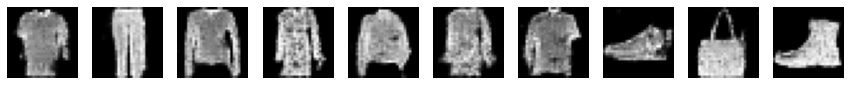

Labels [0, 1, 2, 3, 4, 3, 6, 7, 8, 9]
4350 [D loss: 0.688971, acc.:55.08%] [G loss: 0.723817]


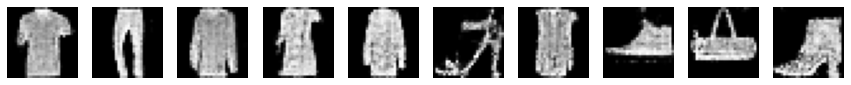

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4500 [D loss: 0.681627, acc.:61.33%] [G loss: 0.719166]


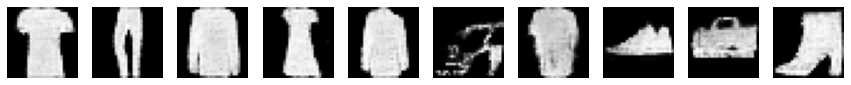

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4650 [D loss: 0.688334, acc.:53.52%] [G loss: 0.720883]


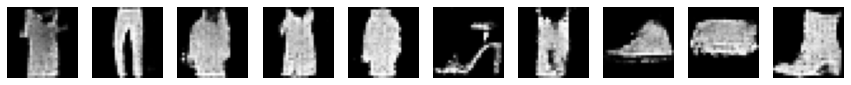

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4800 [D loss: 0.691720, acc.:49.61%] [G loss: 0.722623]


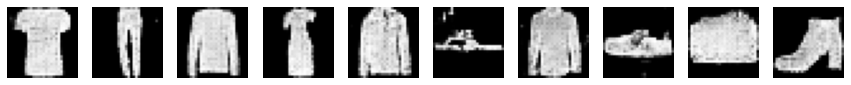

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4950 [D loss: 0.697208, acc.:45.31%] [G loss: 0.710642]


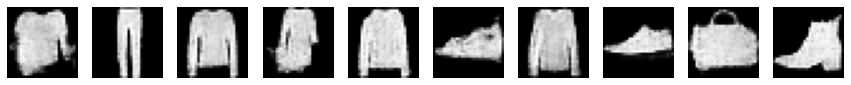

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5100 [D loss: 0.695331, acc.:49.61%] [G loss: 0.710033]


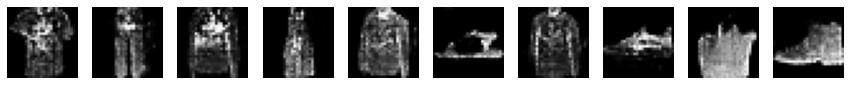

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5250 [D loss: 0.691864, acc.:53.91%] [G loss: 0.710170]


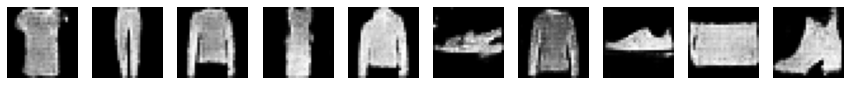

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5400 [D loss: 0.693830, acc.:50.78%] [G loss: 0.708535]


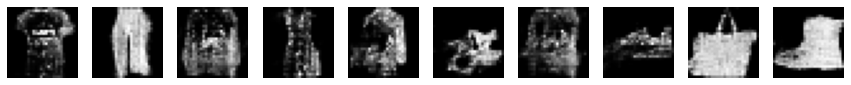

Labels [0, 1, 2, 3, 4, 5, 2, 7, 8, 9]
5550 [D loss: 0.704729, acc.:42.97%] [G loss: 0.687667]


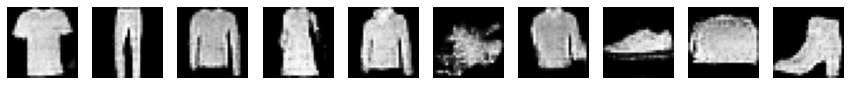

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5700 [D loss: 0.692354, acc.:53.91%] [G loss: 0.718224]


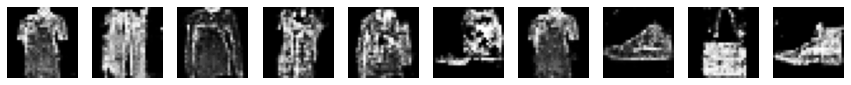

Labels [0, 1, 2, 3, 4, 5, 0, 7, 8, 9]
5850 [D loss: 0.687872, acc.:55.47%] [G loss: 0.709789]


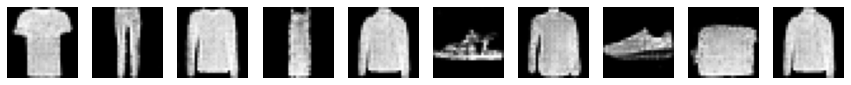

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 4]
6000 [D loss: 0.698586, acc.:44.53%] [G loss: 0.708152]


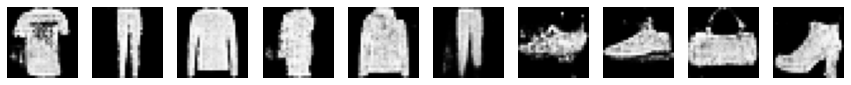

Labels [0, 1, 2, 3, 4, 1, 5, 7, 8, 9]
6150 [D loss: 0.693241, acc.:53.12%] [G loss: 0.713163]


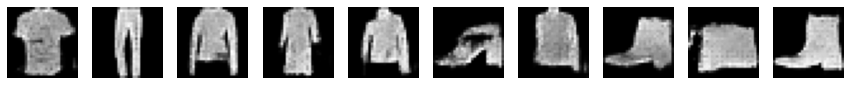

Labels [0, 1, 2, 3, 4, 5, 6, 9, 8, 9]
6300 [D loss: 0.686602, acc.:53.52%] [G loss: 0.733001]


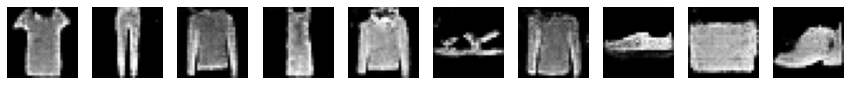

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6450 [D loss: 0.684634, acc.:58.98%] [G loss: 0.730698]


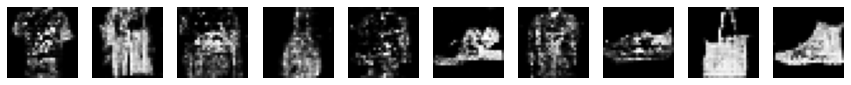

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6600 [D loss: 0.689223, acc.:55.47%] [G loss: 0.710057]


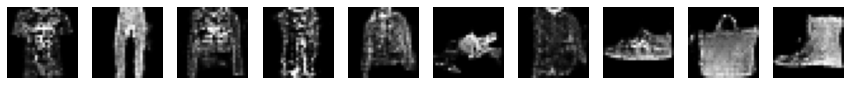

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6750 [D loss: 0.695854, acc.:49.22%] [G loss: 0.706478]


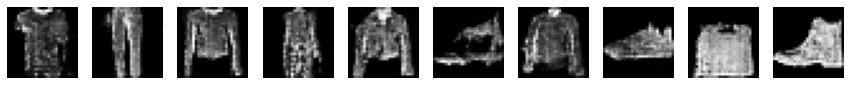

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6900 [D loss: 0.691041, acc.:50.39%] [G loss: 0.717890]


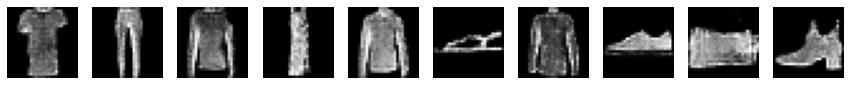

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7050 [D loss: 0.693729, acc.:51.17%] [G loss: 0.709377]


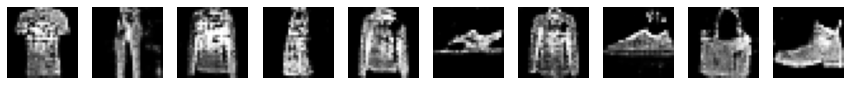

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7200 [D loss: 0.690732, acc.:50.78%] [G loss: 0.709138]


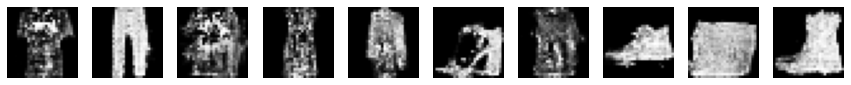

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7350 [D loss: 0.687302, acc.:54.69%] [G loss: 0.723419]


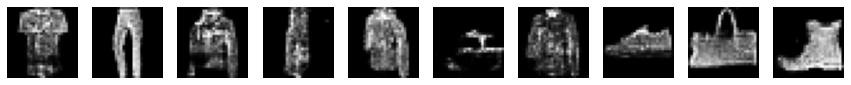

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7500 [D loss: 0.696158, acc.:48.05%] [G loss: 0.718564]


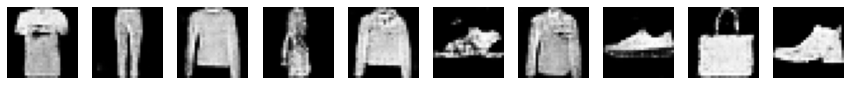

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7650 [D loss: 0.700446, acc.:41.02%] [G loss: 0.695302]


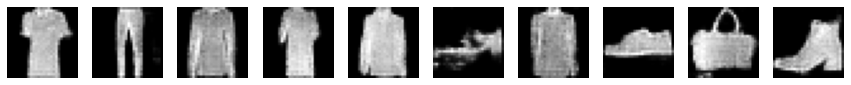

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7800 [D loss: 0.697627, acc.:45.31%] [G loss: 0.694933]


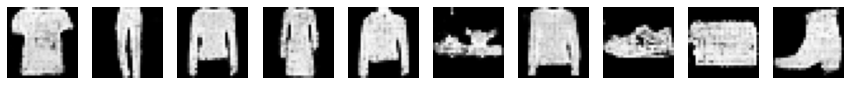

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7950 [D loss: 0.690924, acc.:53.52%] [G loss: 0.694914]


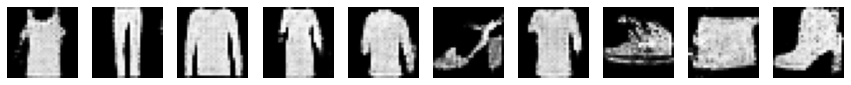

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8100 [D loss: 0.686579, acc.:58.98%] [G loss: 0.710416]


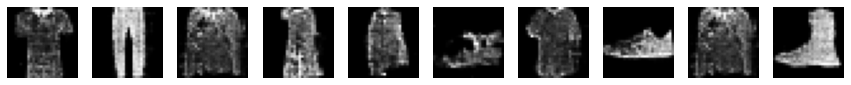

Labels [0, 1, 2, 3, 4, 5, 6, 7, 2, 9]
8250 [D loss: 0.685405, acc.:57.42%] [G loss: 0.723943]


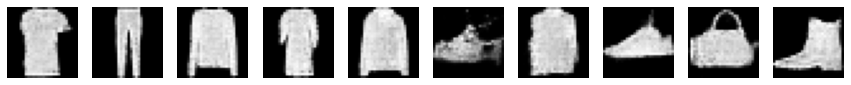

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8400 [D loss: 0.697932, acc.:44.92%] [G loss: 0.695743]


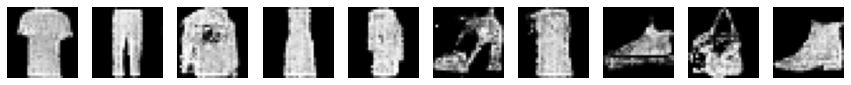

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8550 [D loss: 0.695740, acc.:47.66%] [G loss: 0.711963]


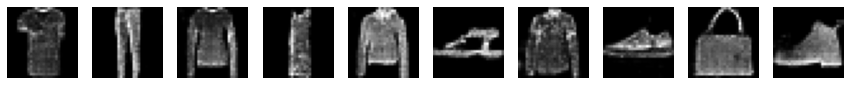

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8700 [D loss: 0.694356, acc.:52.34%] [G loss: 0.715141]


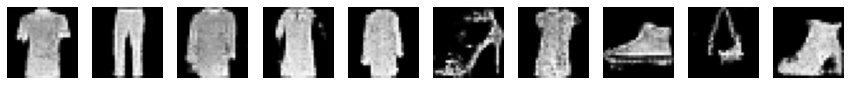

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8850 [D loss: 0.695889, acc.:50.39%] [G loss: 0.708869]


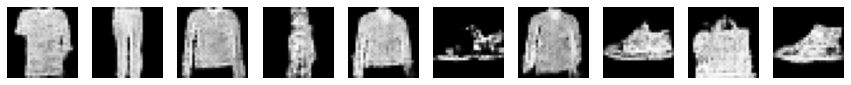

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9000 [D loss: 0.693138, acc.:49.61%] [G loss: 0.713555]


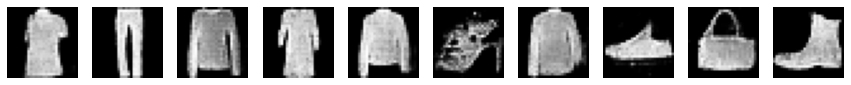

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9150 [D loss: 0.688252, acc.:53.12%] [G loss: 0.712829]


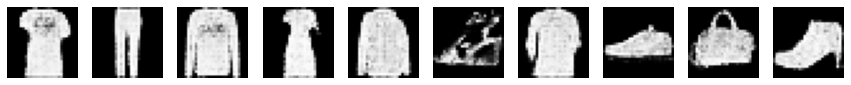

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9300 [D loss: 0.687401, acc.:55.47%] [G loss: 0.713750]


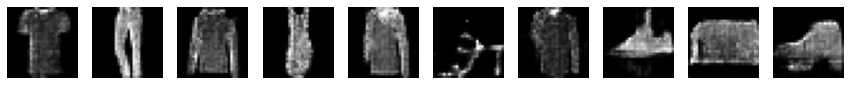

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9450 [D loss: 0.693252, acc.:51.95%] [G loss: 0.702543]


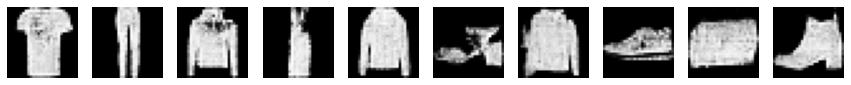

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9600 [D loss: 0.697437, acc.:49.22%] [G loss: 0.701583]


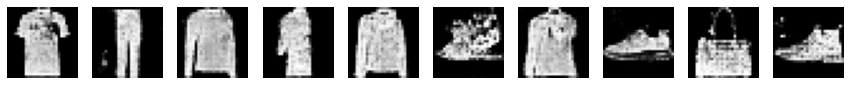

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9750 [D loss: 0.694646, acc.:49.22%] [G loss: 0.694449]


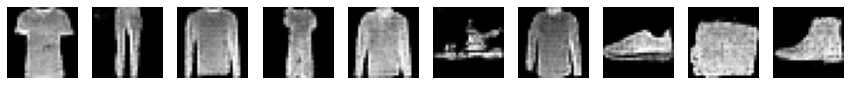

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9900 [D loss: 0.687455, acc.:55.08%] [G loss: 0.714489]


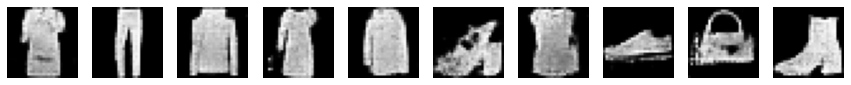

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10050 [D loss: 0.688916, acc.:54.30%] [G loss: 0.722545]


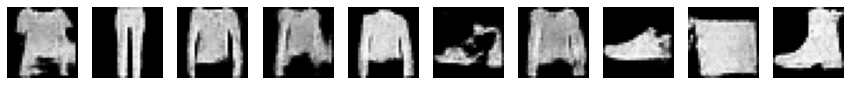

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10200 [D loss: 0.690549, acc.:52.73%] [G loss: 0.702675]


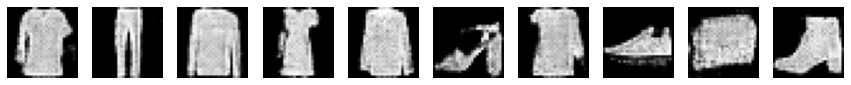

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10350 [D loss: 0.674781, acc.:62.11%] [G loss: 0.734021]


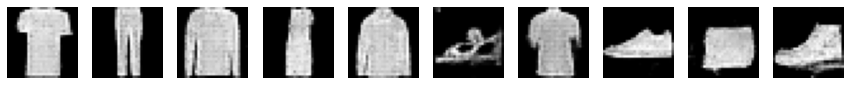

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10500 [D loss: 0.685826, acc.:57.42%] [G loss: 0.722942]


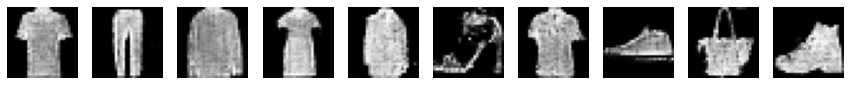

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10650 [D loss: 0.702638, acc.:45.70%] [G loss: 0.698790]


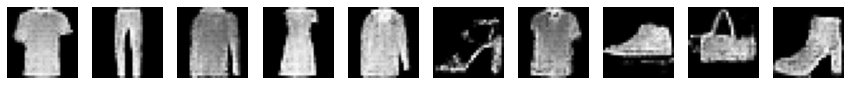

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10800 [D loss: 0.696394, acc.:48.05%] [G loss: 0.705763]


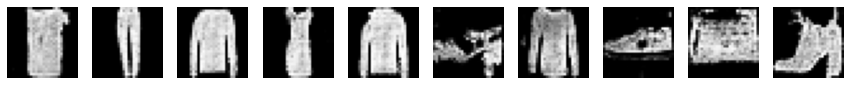

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
10950 [D loss: 0.696855, acc.:46.48%] [G loss: 0.704620]


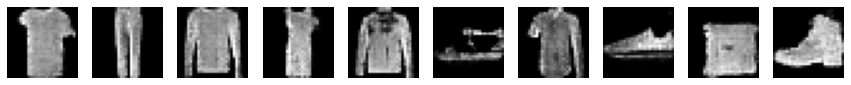

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11100 [D loss: 0.691951, acc.:50.00%] [G loss: 0.708830]


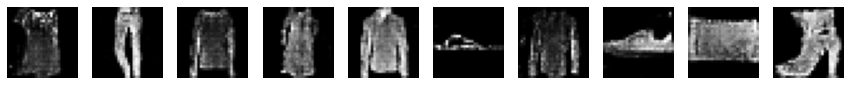

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11250 [D loss: 0.696397, acc.:48.83%] [G loss: 0.703780]


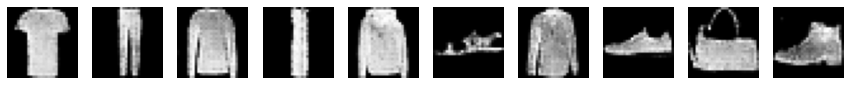

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11400 [D loss: 0.696000, acc.:45.70%] [G loss: 0.701803]


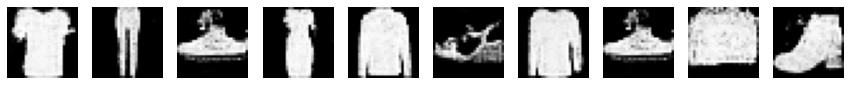

Labels [0, 1, 7, 3, 4, 5, 6, 7, 8, 9]
11550 [D loss: 0.691243, acc.:51.56%] [G loss: 0.715366]


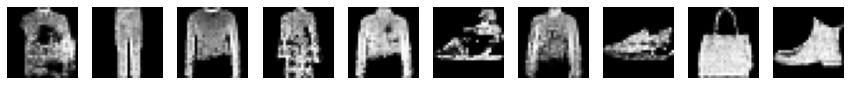

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11700 [D loss: 0.697102, acc.:42.97%] [G loss: 0.706908]


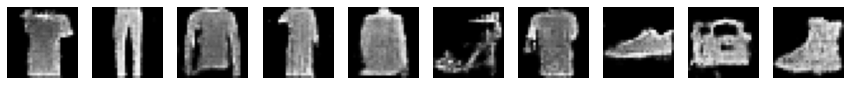

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
11850 [D loss: 0.685275, acc.:57.42%] [G loss: 0.733283]


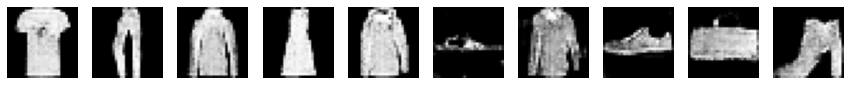

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12000 [D loss: 0.686484, acc.:56.64%] [G loss: 0.727411]


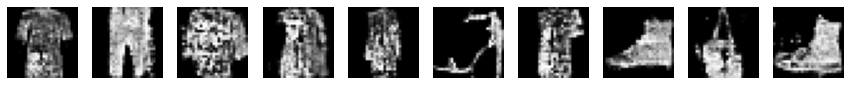

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12150 [D loss: 0.703969, acc.:47.27%] [G loss: 0.700526]


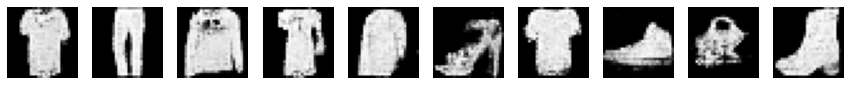

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12300 [D loss: 0.696871, acc.:43.36%] [G loss: 0.704996]


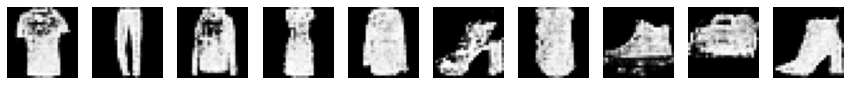

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12450 [D loss: 0.696061, acc.:48.05%] [G loss: 0.703714]


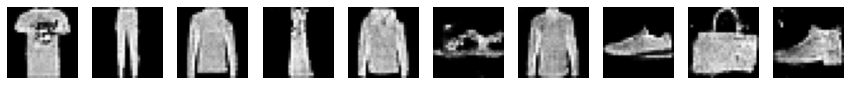

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12600 [D loss: 0.690543, acc.:53.12%] [G loss: 0.718709]


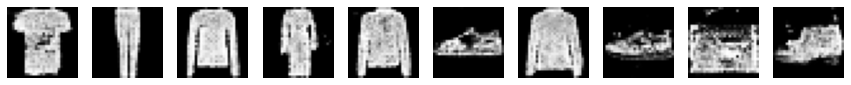

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12750 [D loss: 0.700413, acc.:46.88%] [G loss: 0.705010]


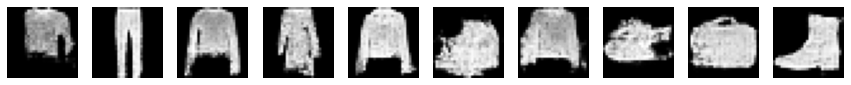

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
12900 [D loss: 0.690881, acc.:51.17%] [G loss: 0.707032]


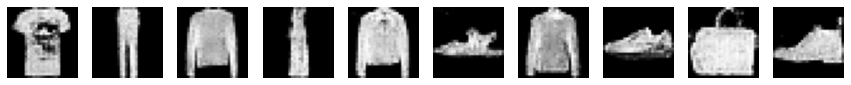

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13050 [D loss: 0.688713, acc.:50.78%] [G loss: 0.716472]


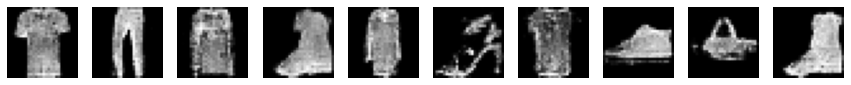

Labels [0, 1, 2, 9, 4, 5, 6, 7, 8, 9]
13200 [D loss: 0.690419, acc.:50.78%] [G loss: 0.707672]


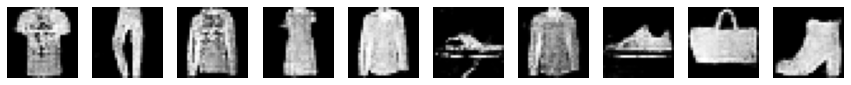

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13350 [D loss: 0.696400, acc.:50.39%] [G loss: 0.713718]


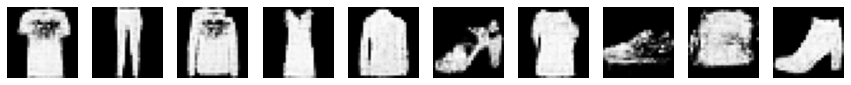

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13500 [D loss: 0.696745, acc.:48.83%] [G loss: 0.705407]


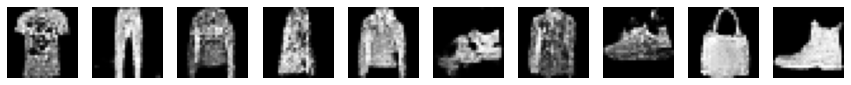

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13650 [D loss: 0.691949, acc.:54.30%] [G loss: 0.704035]


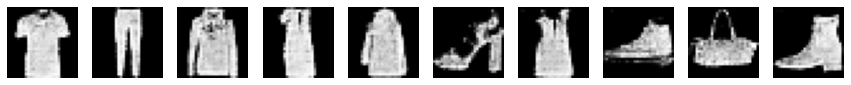

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13800 [D loss: 0.687673, acc.:53.52%] [G loss: 0.712318]


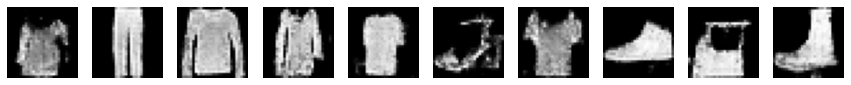

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
13950 [D loss: 0.694471, acc.:50.39%] [G loss: 0.705220]


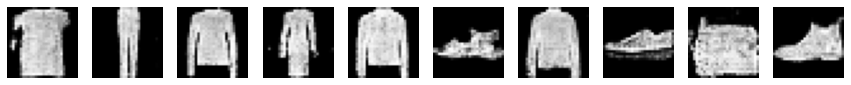

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
14100 [D loss: 0.688955, acc.:52.34%] [G loss: 0.703264]


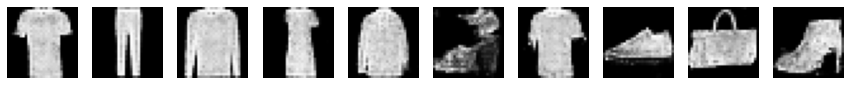

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
14250 [D loss: 0.687680, acc.:50.78%] [G loss: 0.702941]


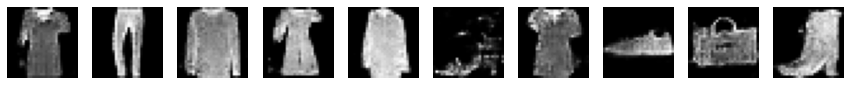

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
14400 [D loss: 0.689509, acc.:51.56%] [G loss: 0.710672]


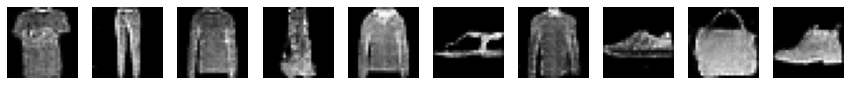

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
14550 [D loss: 0.689205, acc.:53.12%] [G loss: 0.716699]


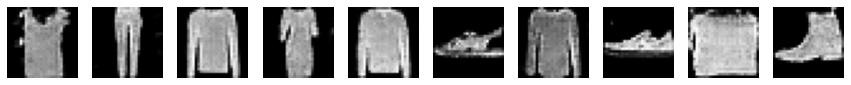

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
14700 [D loss: 0.693031, acc.:48.44%] [G loss: 0.713480]


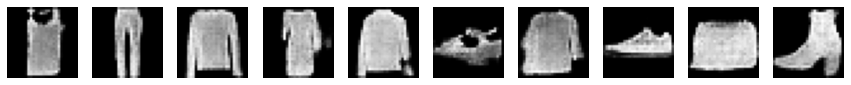

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
14850 [D loss: 0.696110, acc.:48.44%] [G loss: 0.706714]


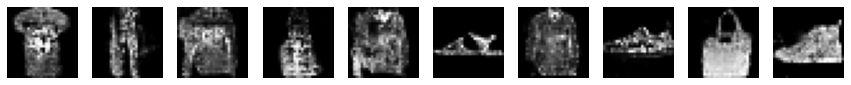

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
14999 [D loss: 0.696516, acc.:49.22%] [G loss: 0.703967]


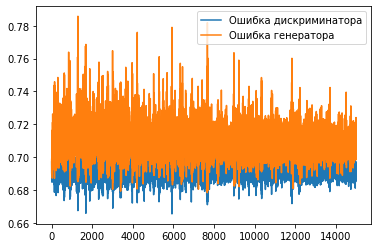

AttributeError: ignored

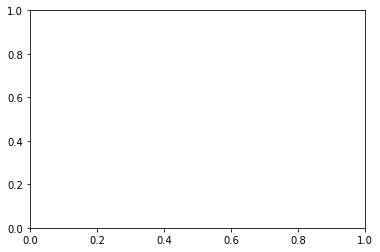

In [ ]:
GAN_alorithm(cc_gen,cc_discr,model,x_train,y_trainlb,x_testMnist,y_testMnistlb,epochs=15000)

In [ ]:
#сохранение весов
cc_gen.save_weights('/content/drive/MyDrive/PostUAI/advancedGAN/FashionMnistViaMnist/cc_gen29000_weights.h5')
cc_discr.save_weights('/content/drive/MyDrive/PostUAI/advancedGAN/FashionMnistViaMnist/cc_discr29000_weights.h5')

И еще на 10к
And 10k epochs more in additional.

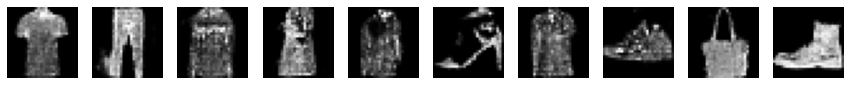

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
0 [D loss: 0.700495, acc.:43.36%] [G loss: 0.699198]


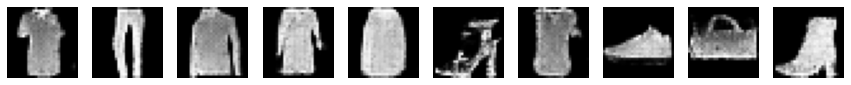

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
150 [D loss: 0.687670, acc.:55.47%] [G loss: 0.711717]


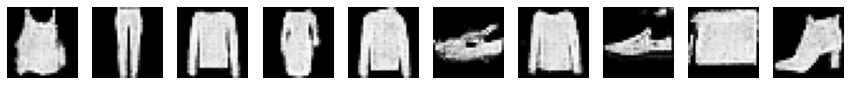

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
300 [D loss: 0.692046, acc.:46.88%] [G loss: 0.719226]


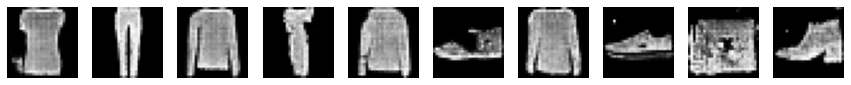

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
450 [D loss: 0.689603, acc.:55.86%] [G loss: 0.716588]


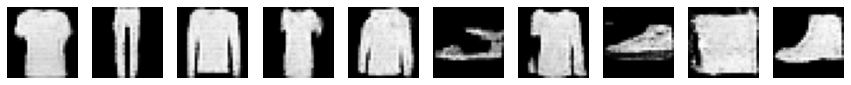

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
600 [D loss: 0.696587, acc.:45.70%] [G loss: 0.703370]


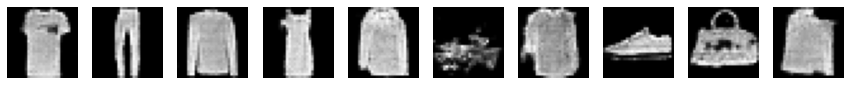

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 4]
750 [D loss: 0.686421, acc.:58.20%] [G loss: 0.717662]


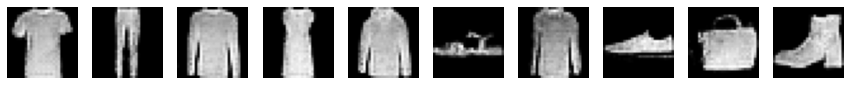

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
900 [D loss: 0.692705, acc.:48.83%] [G loss: 0.708723]


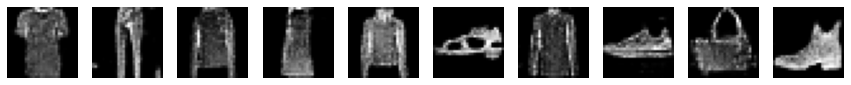

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1050 [D loss: 0.686518, acc.:56.25%] [G loss: 0.704248]


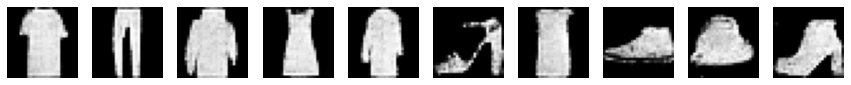

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1200 [D loss: 0.692798, acc.:50.78%] [G loss: 0.708839]


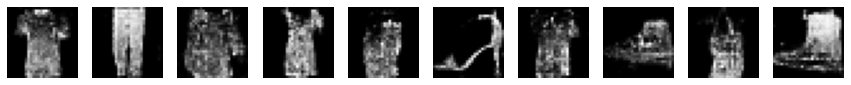

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1350 [D loss: 0.689796, acc.:49.61%] [G loss: 0.713427]


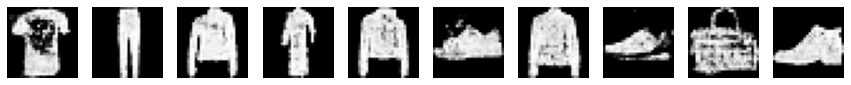

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1500 [D loss: 0.685708, acc.:57.42%] [G loss: 0.707639]


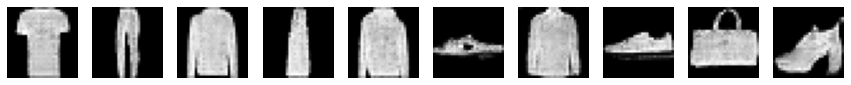

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1650 [D loss: 0.694361, acc.:50.00%] [G loss: 0.710769]


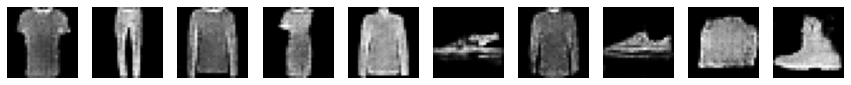

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1800 [D loss: 0.687494, acc.:51.95%] [G loss: 0.706055]


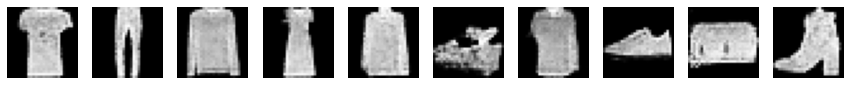

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
1950 [D loss: 0.693101, acc.:47.66%] [G loss: 0.712823]


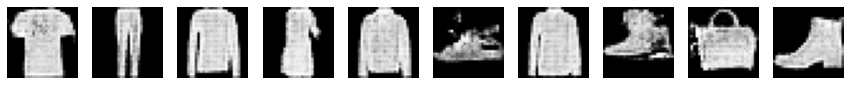

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2100 [D loss: 0.693611, acc.:47.27%] [G loss: 0.710762]


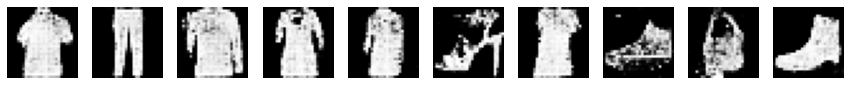

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2250 [D loss: 0.692673, acc.:51.95%] [G loss: 0.706230]


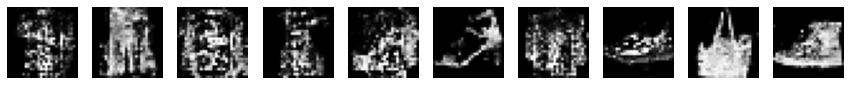

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2400 [D loss: 0.694722, acc.:46.09%] [G loss: 0.694507]


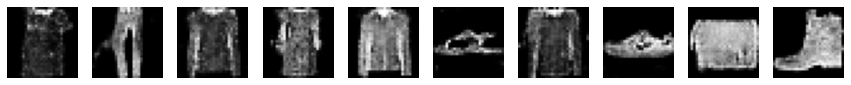

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2550 [D loss: 0.690793, acc.:48.83%] [G loss: 0.702105]


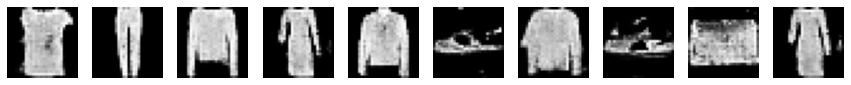

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 3]
2700 [D loss: 0.692737, acc.:53.52%] [G loss: 0.711320]


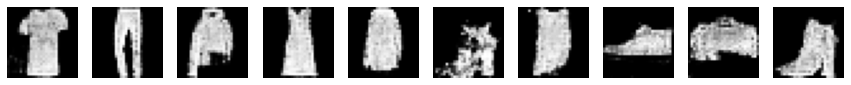

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2850 [D loss: 0.692667, acc.:53.91%] [G loss: 0.703990]


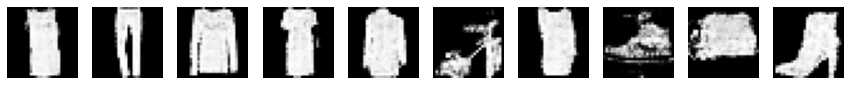

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3000 [D loss: 0.696857, acc.:47.27%] [G loss: 0.704189]


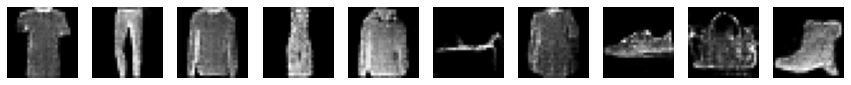

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3150 [D loss: 0.694362, acc.:46.48%] [G loss: 0.709051]


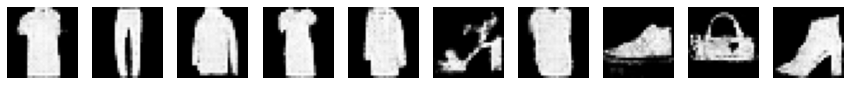

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3300 [D loss: 0.689238, acc.:50.00%] [G loss: 0.705245]


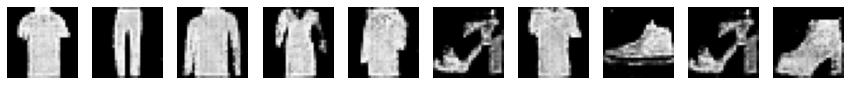

Labels [0, 1, 2, 3, 4, 5, 6, 7, 5, 9]
3450 [D loss: 0.683519, acc.:58.98%] [G loss: 0.711851]


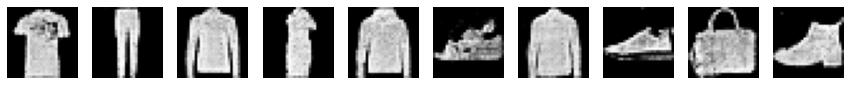

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3600 [D loss: 0.689601, acc.:53.52%] [G loss: 0.718118]


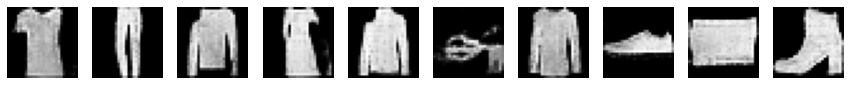

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3750 [D loss: 0.695731, acc.:49.22%] [G loss: 0.712488]


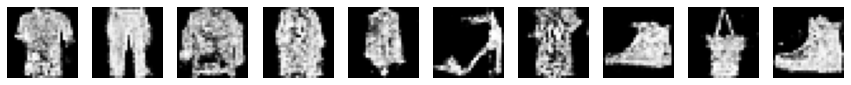

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
3900 [D loss: 0.694018, acc.:45.31%] [G loss: 0.700465]


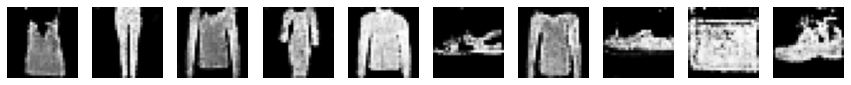

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4050 [D loss: 0.691280, acc.:49.22%] [G loss: 0.704127]


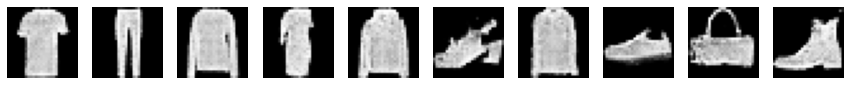

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4200 [D loss: 0.692223, acc.:52.34%] [G loss: 0.719090]


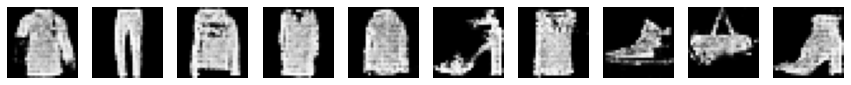

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4350 [D loss: 0.694286, acc.:46.48%] [G loss: 0.720235]


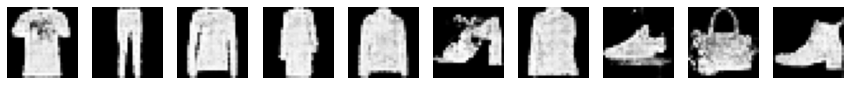

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4500 [D loss: 0.690208, acc.:53.12%] [G loss: 0.709178]


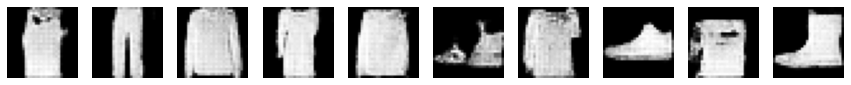

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4650 [D loss: 0.689983, acc.:53.91%] [G loss: 0.720487]


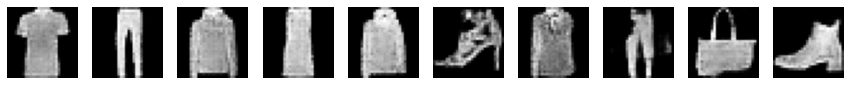

Labels [0, 1, 2, 3, 4, 5, 6, 1, 8, 9]
4800 [D loss: 0.694163, acc.:52.34%] [G loss: 0.707430]


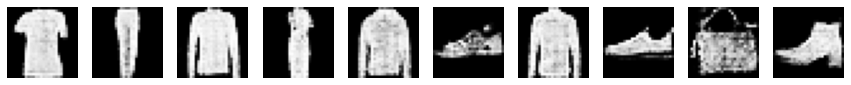

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
4950 [D loss: 0.697133, acc.:41.41%] [G loss: 0.701084]


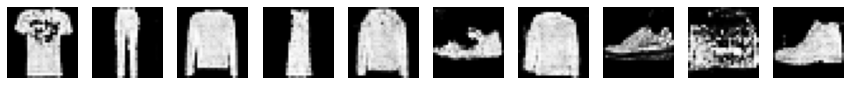

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5100 [D loss: 0.694214, acc.:46.09%] [G loss: 0.712030]


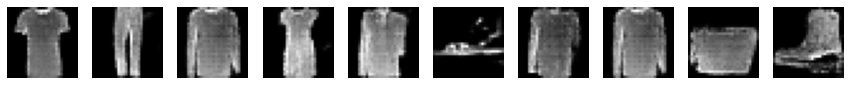

Labels [0, 1, 2, 3, 4, 5, 6, 2, 8, 9]
5250 [D loss: 0.688930, acc.:52.34%] [G loss: 0.706562]


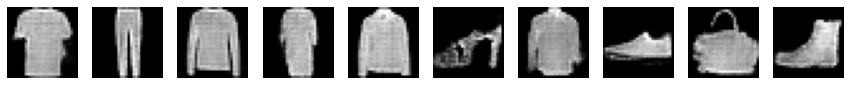

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5400 [D loss: 0.692433, acc.:50.00%] [G loss: 0.710139]


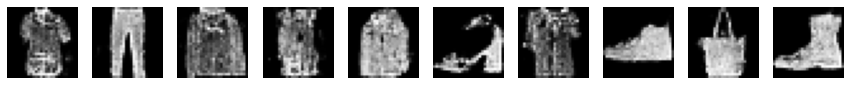

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5550 [D loss: 0.690194, acc.:49.61%] [G loss: 0.708186]


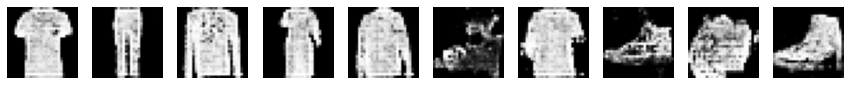

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
5700 [D loss: 0.698593, acc.:42.19%] [G loss: 0.710015]


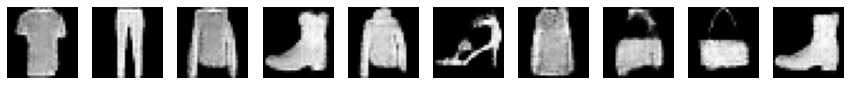

Labels [0, 1, 2, 9, 4, 5, 6, 8, 8, 9]
5850 [D loss: 0.687252, acc.:51.17%] [G loss: 0.722699]


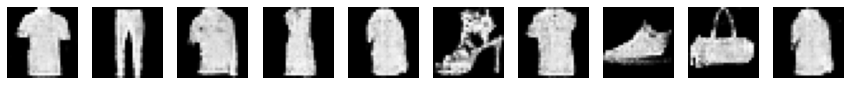

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 4]
6000 [D loss: 0.694039, acc.:51.17%] [G loss: 0.707098]


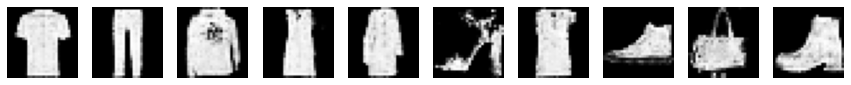

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6150 [D loss: 0.693639, acc.:48.05%] [G loss: 0.709267]


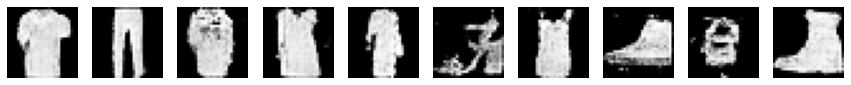

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6300 [D loss: 0.685018, acc.:59.77%] [G loss: 0.723873]


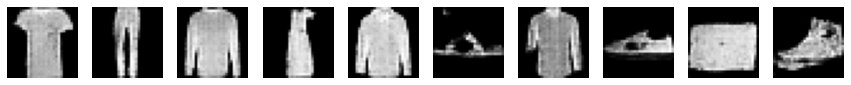

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6450 [D loss: 0.689026, acc.:52.73%] [G loss: 0.707461]


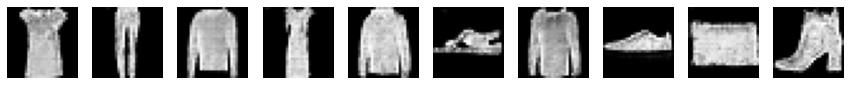

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6600 [D loss: 0.693026, acc.:48.05%] [G loss: 0.705706]


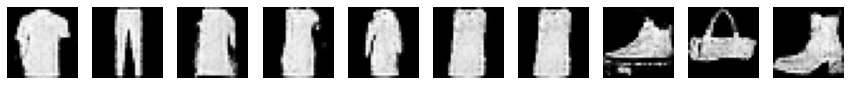

Labels [0, 1, 2, 3, 4, 6, 6, 7, 8, 9]
6750 [D loss: 0.697934, acc.:46.48%] [G loss: 0.709031]


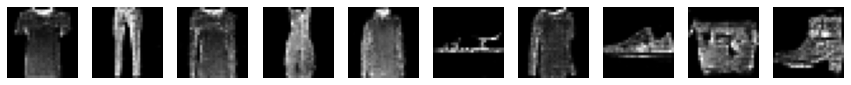

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
6900 [D loss: 0.693414, acc.:48.44%] [G loss: 0.709695]


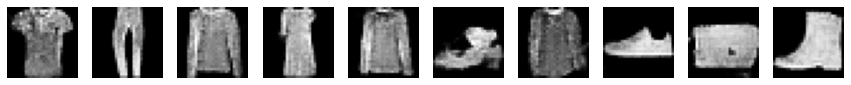

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7050 [D loss: 0.682289, acc.:59.77%] [G loss: 0.720332]


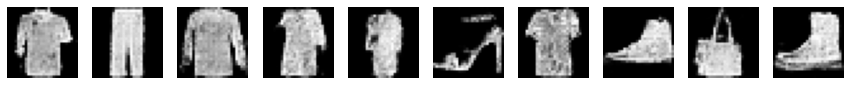

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7200 [D loss: 0.687026, acc.:56.64%] [G loss: 0.707153]


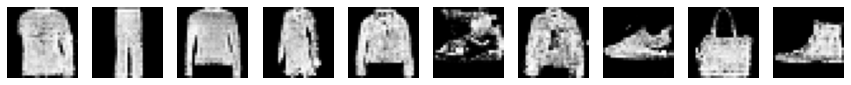

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7350 [D loss: 0.689532, acc.:51.95%] [G loss: 0.711944]


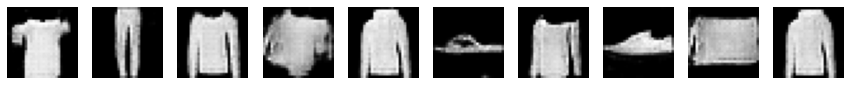

Labels [0, 1, 2, 8, 4, 5, 6, 7, 8, 4]
7500 [D loss: 0.689651, acc.:54.30%] [G loss: 0.725597]


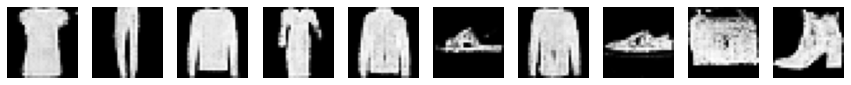

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7650 [D loss: 0.697963, acc.:48.44%] [G loss: 0.708725]


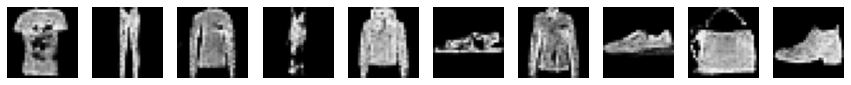

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7800 [D loss: 0.692634, acc.:51.95%] [G loss: 0.703410]


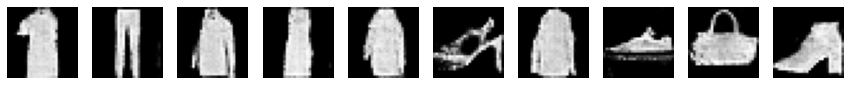

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
7950 [D loss: 0.690747, acc.:51.17%] [G loss: 0.706703]


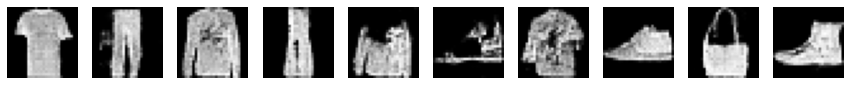

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8100 [D loss: 0.693153, acc.:51.95%] [G loss: 0.716638]


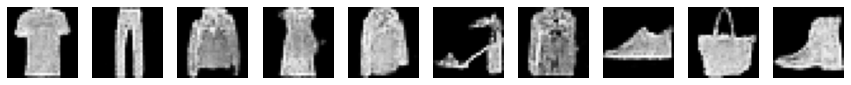

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8250 [D loss: 0.696778, acc.:48.83%] [G loss: 0.715267]


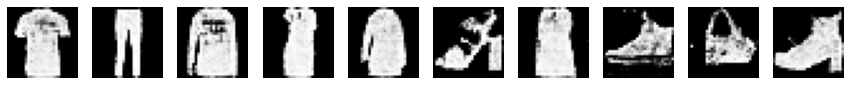

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8400 [D loss: 0.687318, acc.:58.98%] [G loss: 0.717377]


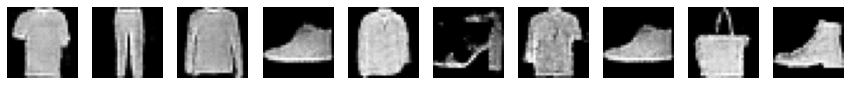

Labels [0, 1, 2, 7, 4, 5, 6, 7, 8, 9]
8550 [D loss: 0.693573, acc.:50.39%] [G loss: 0.707285]


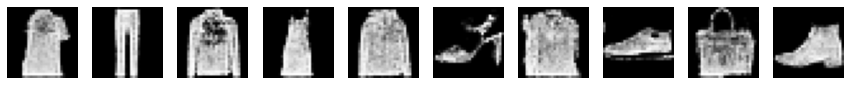

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8700 [D loss: 0.693960, acc.:50.00%] [G loss: 0.710581]


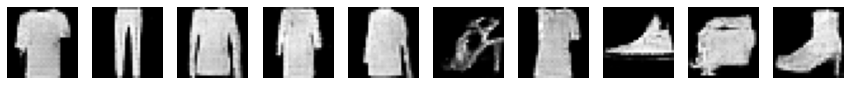

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
8850 [D loss: 0.685297, acc.:58.20%] [G loss: 0.717697]


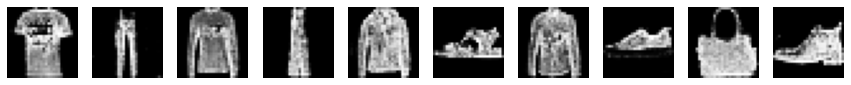

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9000 [D loss: 0.693058, acc.:53.91%] [G loss: 0.724286]


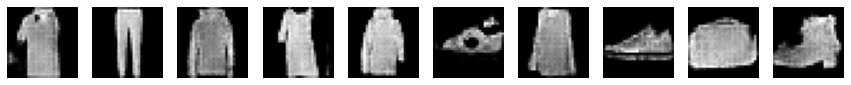

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9150 [D loss: 0.693538, acc.:52.34%] [G loss: 0.704355]


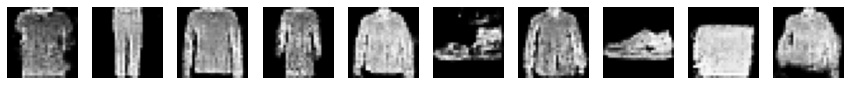

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 4]
9300 [D loss: 0.691408, acc.:53.91%] [G loss: 0.707558]


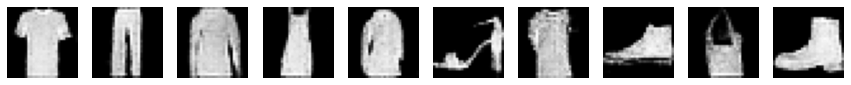

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9450 [D loss: 0.687062, acc.:57.81%] [G loss: 0.726427]


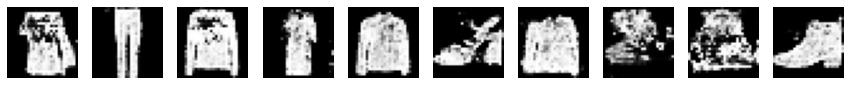

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9600 [D loss: 0.694002, acc.:47.66%] [G loss: 0.707848]


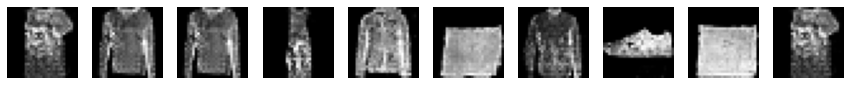

Labels [0, 2, 2, 3, 4, 8, 6, 7, 8, 0]
9750 [D loss: 0.694198, acc.:48.83%] [G loss: 0.707744]


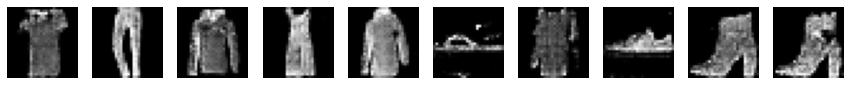

Labels [0, 1, 2, 3, 4, 5, 6, 7, 9, 9]
9900 [D loss: 0.693705, acc.:50.78%] [G loss: 0.715757]


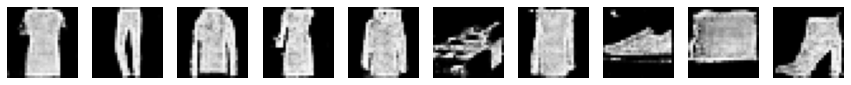

Labels [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
9999 [D loss: 0.694086, acc.:48.44%] [G loss: 0.713692]


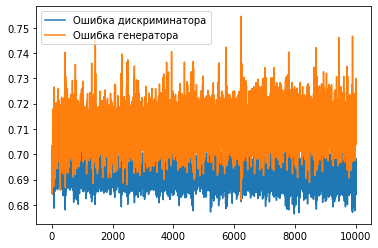

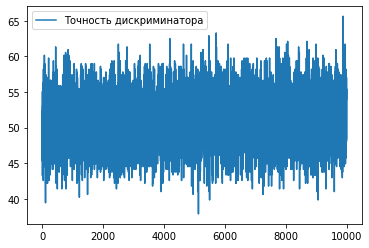

In [ ]:
GAN_alorithm(cc_gen,cc_discr,model,x_train,y_trainlb,x_testMnist,y_testMnistlb,epochs=10000)

In [ ]:
#сохраняем модель
cc_gen.save_weights('/content/drive/MyDrive/PostUAI/advGAN/FashionMnistViaMnist/cc_gen39000_weights.h5')
cc_discr.save_weights('/content/drive/MyDrive/PostUAI/advGAN/FashionMnistViaMnist/cc_discr39000_weights.h5')

##Visualisation

In [ ]:
#функция визуализации
def testGAN(gen,classifier,x_train,y_train,x_data,y_data):
  fig,axs=plt.subplots(3,10,figsize=(15,5))

  for i in range(10):
    
    curr_numbers=x_data[y_data==i]
    ind=np.random.randint(0,curr_numbers.shape[0])  #получаем индекс
    
    axs[0,i].imshow(curr_numbers[ind],cmap='gray')  #рисуем цифру мнист
    axs[0,i].axis('off')
    lb=classifier.predict(np.expand_dims(curr_numbers[ind],axis=0)) #генерируем изображение
    noise=np.random.normal(size=(1,random_vec))
    gen_img=gen.predict([noise,lb])
    
    axs[1,i].imshow(gen_img[0].reshape(28,28),cmap='gray') #рисуем результат генератора
    axs[1,i].axis('off')
    axs[2,i].imshow(np.squeeze(x_train[y_train==i][0]),cmap='gray') #рисуем пример изображений
    axs[2,i].axis('off')

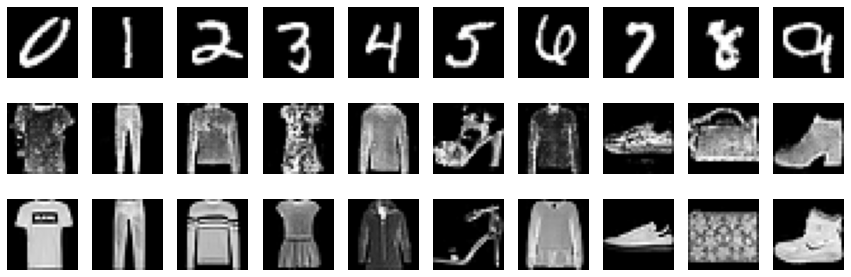

In [ ]:
testGAN(cc_gen,model,x_train,y_trainlb,x_testMnist,y_testMnistlb)

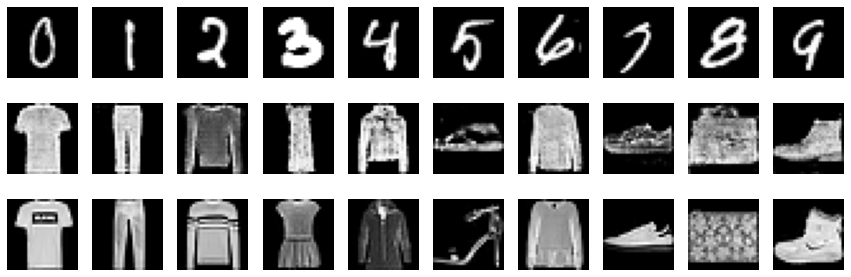

In [ ]:
testGAN(cc_gen,model,x_train,y_trainlb,x_testMnist,y_testMnistlb)

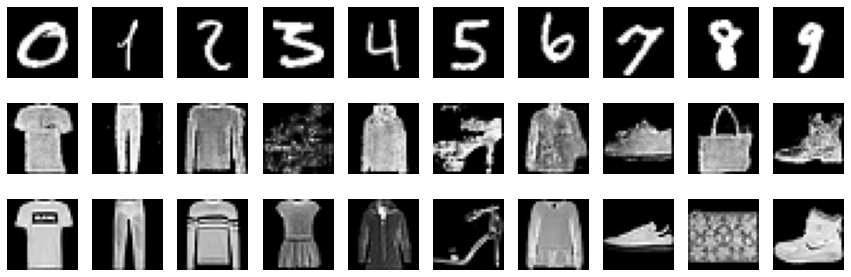

In [ ]:
testGAN(cc_gen,model,x_train,y_trainlb,x_testMnist,y_testMnistlb)